In [1]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [2]:
import os, glob
import matplotlib.pyplot as plt
import numpy as np
import pickle
import nibabel as nb
import matplotlib.image as mpimg
import cv2
import tensorflow as tf
from keras_preprocessing.image import ImageDataGenerator
from tensorflow import keras
from tensorflow.keras.utils import normalize
from tensorflow.keras.utils import to_categorical
from tqdm.notebook import tqdm 
from sys import getsizeof
from tensorflow.keras.models import load_model
from tensorflow.keras.metrics import MeanIoU

import nibabel as nib

In [3]:
# Define constants

# Path variables
model1_path = '/content/drive/Shareddrives/Banana Leaf Development/Data/Couinaud_Annotation_Data/model_notebooks/CompleteDataSet/4-Models:0-2,3-4,5-6,7-8/Model1'
model2_path = '/content/drive/Shareddrives/Banana Leaf Development/Data/Couinaud_Annotation_Data/model_notebooks/CompleteDataSet/4-Models:0-2,3-4,5-6,7-8/Model2'
model3_path = '/content/drive/Shareddrives/Banana Leaf Development/Data/Couinaud_Annotation_Data/model_notebooks/CompleteDataSet/4-Models:0-2,3-4,5-6,7-8/Model3'
model4_path = '/content/drive/Shareddrives/Banana Leaf Development/Data/Couinaud_Annotation_Data/model_notebooks/CompleteDataSet/4-Models:0-2,3-4,5-6,7-8/Model4'

data_dir = '/content/drive/Shareddrives/Banana Leaf Development/Data/Couinaud_Annotation_Data/'
data_dir_test_image = os.path.join(data_dir, 'complete_dataset/testing/img:-1000:1000/img/')
data_dir_test_mask = os.path.join(data_dir, 'complete_dataset/testing/couinaud/img/')

# Training variables
SEED = 7
BATCH_SIZE_TRAIN = 10
BATCH_SIZE_TEST = 10
BATCH_SIZE_VALIDATE = 10
NUM_TRAIN = 9288
NUM_TEST = 1042
NUM_VALIDATE = 1207

N_CLASSES = 9


# Image variables
IMAGE_HEIGHT = int(512/4)
IMAGE_WIDTH = int(512/4)
IMG_SIZE = (IMAGE_HEIGHT, IMAGE_WIDTH)


#Original Image size
OG_IMAGE_HEIGHT = 512
OG_IMAGE_WIDTH = 512
OG_IMG_SIZE = (OG_IMAGE_HEIGHT, OG_IMAGE_WIDTH)

NUM_EPOCH = 100



Load Testing Data

In [64]:
#Load Testing Images
test_images = []
scaled_test_images = []

for index, img_path in tqdm(enumerate(sorted(glob.iglob(data_dir_test_image+ '*.png')))):
  substring = img_path[-5:]

  img = cv2.imread(img_path, 0)       
  test_images.append(img)
  scaled_test_images.append(cv2.resize(img, IMG_SIZE, interpolation = cv2.INTER_LINEAR))

#Convert list to array for machine learning processing        
test_images = np.array(test_images)
scaled_test_images = np.array(scaled_test_images)

print('##### TESTING IMAGES #####')
print(test_images.shape)
print(scaled_test_images.shape)
print(type(test_images[0,0,0]))


##### TESTING IMAGES #####
(1042, 512, 512)
(1042, 128, 128)
<class 'numpy.uint8'>


In [65]:
scaled_test_images = np.expand_dims(scaled_test_images, axis=3)
print(scaled_test_images.shape)

(1042, 128, 128, 1)


In [66]:
#Test masks but no encoding for calculating IOU
test_masks_no_encode = [] 
scaled_test_masks_no_encode = []
for index, img_path in tqdm(enumerate(sorted(glob.iglob(data_dir_test_mask + '*.tif')))):
  substring = img_path[-5:]

  img = cv2.imread(img_path, 0) 
  test_masks_no_encode.append(img)
  scaled_test_masks_no_encode.append(cv2.resize(img, IMG_SIZE, interpolation = cv2.INTER_LINEAR))

#Convert list to array for machine learning processing      
test_masks_no_encode = np.array(test_masks_no_encode)
scaled_test_masks_no_encode = np.array(scaled_test_masks_no_encode)

test_masks_no_encode = np.expand_dims(test_masks_no_encode, axis=3)
scaled_test_masks_no_encode = np.expand_dims(scaled_test_masks_no_encode, axis=3)

print(test_masks_no_encode.shape)
print(scaled_test_masks_no_encode.shape)


(1042, 512, 512, 1)
(1042, 128, 128, 1)


Import Models

In [67]:
#Load Models
model1 = load_model(model1_path)
model2 = load_model(model2_path)
model3 = load_model(model3_path)
model4 = load_model(model4_path)

Prediting Masks

In [68]:
mask_pred1=model1.predict(scaled_test_images)
mask_pred_argmax1=np.argmax(mask_pred1, axis=3) #Convert the probability into a max value within the area \

In [69]:
mask_pred2=model2.predict(scaled_test_images)
mask_pred_argmax2=np.argmax(mask_pred2, axis=3) #Convert the probability into a max value within the area \

In [70]:
mask_pred3=model3.predict(scaled_test_images)
mask_pred_argmax3=np.argmax(mask_pred3, axis=3) #Convert the probability into a max value within the area \

In [71]:
mask_pred4=model4.predict(scaled_test_images)
mask_pred_argmax4=np.argmax(mask_pred4, axis=3) #Convert the probability into a max value within the area \

Get certain layers for the corresponding classes

In [72]:
#grab the 0th layer from one of the two mask prediction models
# and expand dimensions to have a 4th 
zero_from_mask1 = np.expand_dims(mask_pred1[:,:,:,0], axis=3)
print(zero_from_mask1.shape)

(1042, 128, 128, 1)


In [73]:
#Pull the predicting masks for class 1-2 from Model 1
class_1_to_2 = mask_pred1[:,:,:,1:3]
print(class_1_to_2.shape)

(1042, 128, 128, 2)


In [74]:
#Pull the predicting masks for class 3-4 from Model 2
class_3_to_4 = mask_pred2[:,:,:,1:3]
print(class_3_to_4.shape)

(1042, 128, 128, 2)


In [75]:
#Pull the predicting masks for class 5-6 from Model 3
class_5_to_6 = mask_pred3[:,:,:,1:3]
print(class_5_to_6.shape)

(1042, 128, 128, 2)


In [76]:
#Pull the predicting masks for class 7-8 from Model 4
class_7_to_8 = mask_pred4[:,:,:,1:3]
print(class_7_to_8.shape)

(1042, 128, 128, 2)


Merge the masks from the 4 models

In [77]:
stacked_class_predictions = np.concatenate((zero_from_mask1, class_1_to_2, class_3_to_4, class_5_to_6, class_7_to_8), axis =3)
print(stacked_class_predictions.shape)

models_mask_pred_argmax = np.argmax(stacked_class_predictions, axis = 3)
print(models_mask_pred_argmax.shape)

(1042, 128, 128, 9)
(1042, 128, 128)


Evaluate Model with IoU

In [78]:
IOU = MeanIoU(num_classes=N_CLASSES)  
IOU.update_state(scaled_test_masks_no_encode[:,:,:,0], models_mask_pred_argmax)
print("Mean IoU =", IOU.result().numpy()) #Prev0.61207

Mean IoU = 0.60996926


In [79]:
def calculateClassIOU(cm, num_classes=9):
  #: IOU = true_positive / (true_positive + false_positive + false_negative)
  #cm: confusion matrix where rows are actual and cols are predicted 
  
  for i in range(0,num_classes):
    trueP = cm[i,i]
    falseP = 0
    falseN = 0

    for col in range(0,num_classes):
      if (i != col):
        falseP = falseP + cm[i,col]

    for row in range(0,num_classes):
      if (i != row):
        falseN = falseN + cm[row,i]

    IoU = trueP / (trueP + falseP + falseN)
    print("IoU for class,",i, " is: ", IoU)

In [80]:
#Get confusion Matrix
values = np.array(IOU.get_weights()).reshape(N_CLASSES, N_CLASSES)
print(values)

[[1.6106694e+07 8.4200000e+03 6.9760000e+03 3.1100000e+03 2.4500000e+03
  8.3900000e+02 1.4200000e+03 4.9740000e+03 1.9860000e+03]
 [7.3320000e+03 3.3578000e+04 2.3970000e+03 5.7700000e+02 5.9100000e+02
  4.4800000e+02 4.4100000e+02 1.2950000e+03 2.4760000e+03]
 [9.1760000e+03 2.3910000e+03 8.7990000e+04 8.4430000e+03 7.7190000e+03
  1.7100000e+02 9.7300000e+02 1.2800000e+03 7.6200000e+02]
 [4.6990000e+03 4.7400000e+02 1.2339000e+04 3.7824000e+04 2.3790000e+03
  8.5700000e+02 1.0920000e+03 3.3300000e+02 6.6200000e+02]
 [3.6550000e+03 7.0700000e+02 4.9580000e+03 1.4700000e+03 6.3357000e+04
  4.1310000e+03 1.3160000e+03 1.9400000e+03 1.8707000e+04]
 [7.6860000e+03 9.0700000e+02 4.9800000e+02 4.6000000e+01 6.6190000e+03
  7.8304000e+04 1.2588000e+04 3.9310000e+03 1.7599000e+04]
 [2.2080000e+03 3.9900000e+02 3.3000000e+02 1.7000000e+01 4.0300000e+02
  9.8330000e+03 8.5472000e+04 1.2785000e+04 2.1680000e+03]
 [7.3700000e+02 8.9700000e+02 1.1900000e+02 7.0000000e+00 4.1500000e+02
  2.6900000

In [81]:
#To calculate I0U for each class...
calculateClassIOU(values, N_CLASSES)

IoU for class, 0  is:  0.9958934305152194
IoU for class, 1  is:  0.5184670495954543
IoU for class, 2  is:  0.5993501760791232
IoU for class, 3  is:  0.5088111060292179
IoU for class, 4  is:  0.4887827683572233
IoU for class, 5  is:  0.5197846621572285
IoU for class, 6  is:  0.6033814549433483
IoU for class, 7  is:  0.6527615215801024
IoU for class, 8  is:  0.6024911953188118


Print Input Image and Scaled Mask and Scaled Predicted Mask

In [82]:
def display(display_list):
  plt.figure(figsize = (15,15))
  title = ['Input Image', 'True Mask', 'Predicted Mask', 'Predicted Mask \nw/ Threshold']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]), cmap = 'Greys_r')
  plt.show()

In [83]:
scaled_test_images.shape

(1042, 128, 128, 1)

In [84]:
scaled_test_masks_no_encode.shape

(1042, 128, 128, 1)

In [85]:
meme = np.expand_dims(models_mask_pred_argmax[0], axis=2)

In [86]:
meme.shape

(128, 128, 1)

Instance in test dataset:  0


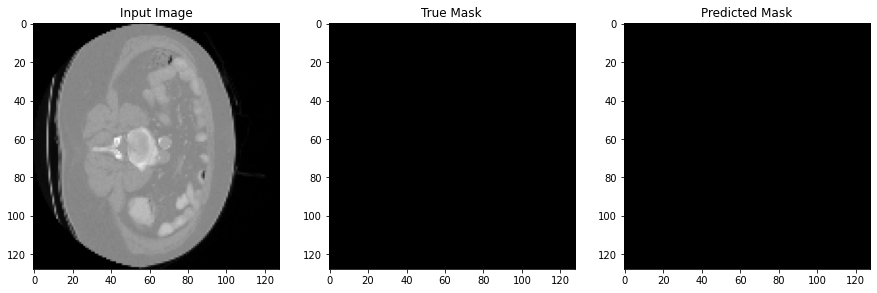

Instance in test dataset:  1


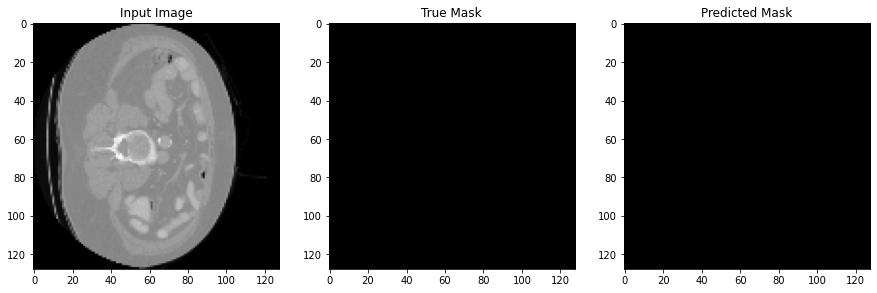

Instance in test dataset:  2


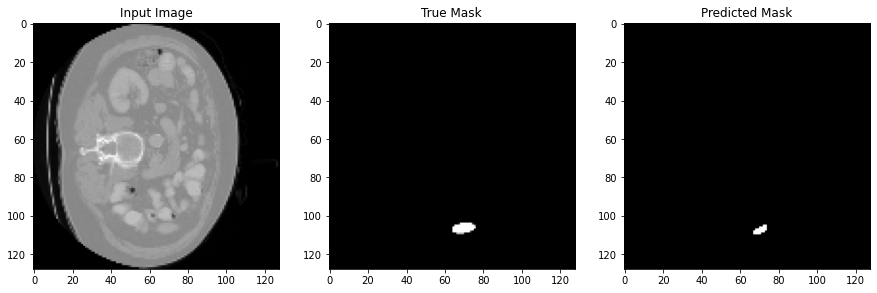

Instance in test dataset:  3


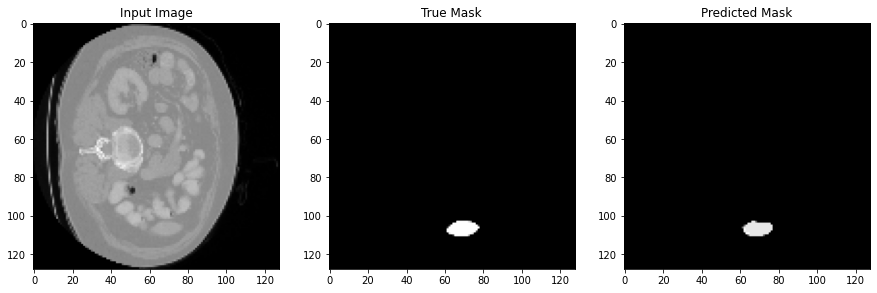

Instance in test dataset:  4


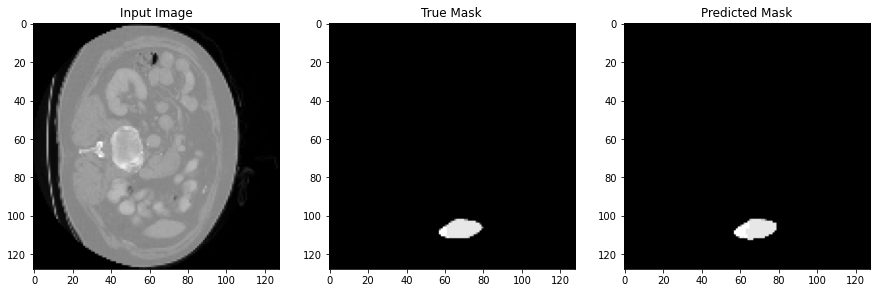

Instance in test dataset:  5


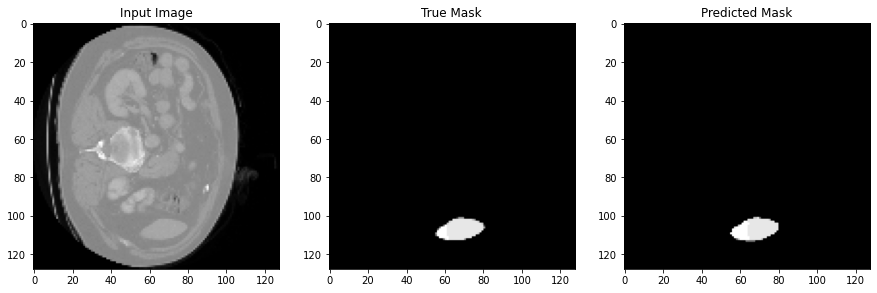

Instance in test dataset:  6


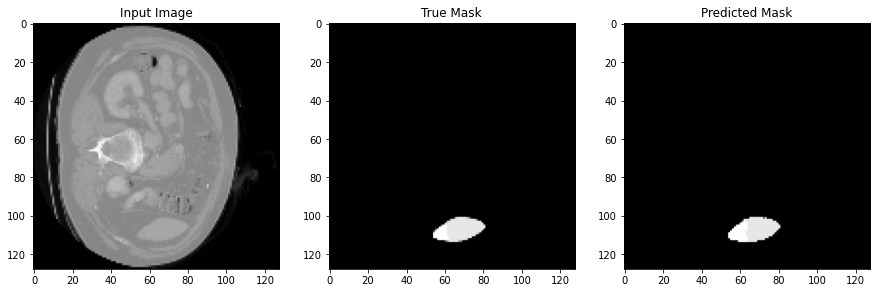

Instance in test dataset:  7


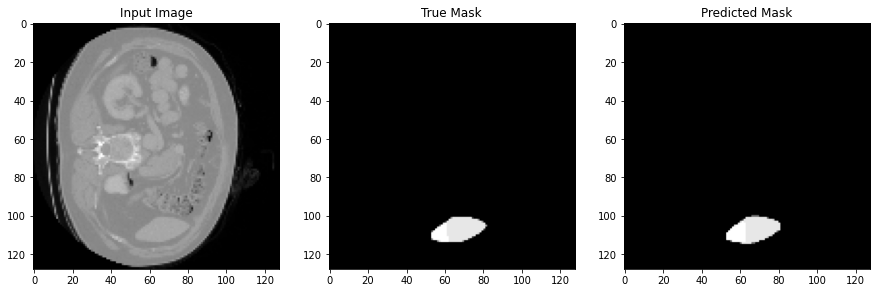

Instance in test dataset:  8


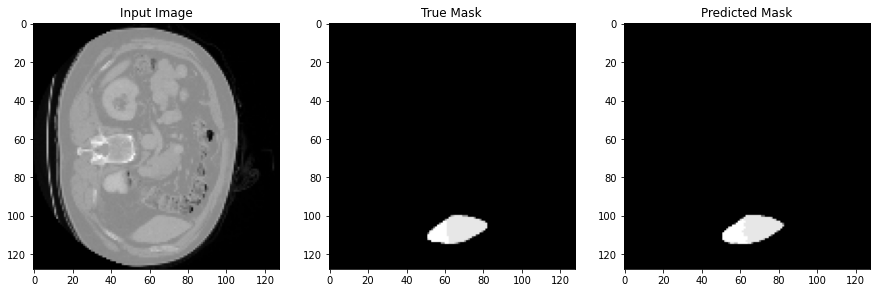

Instance in test dataset:  9


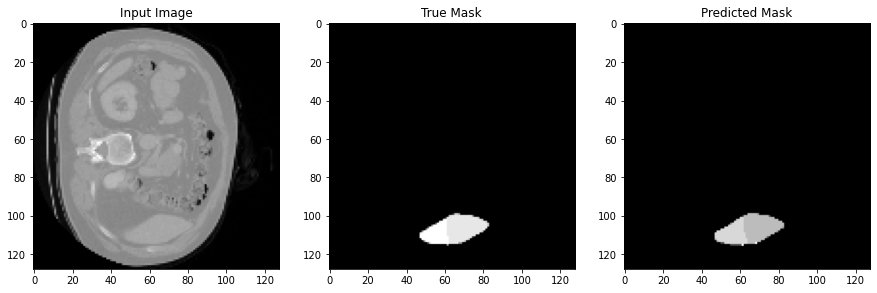

Instance in test dataset:  10


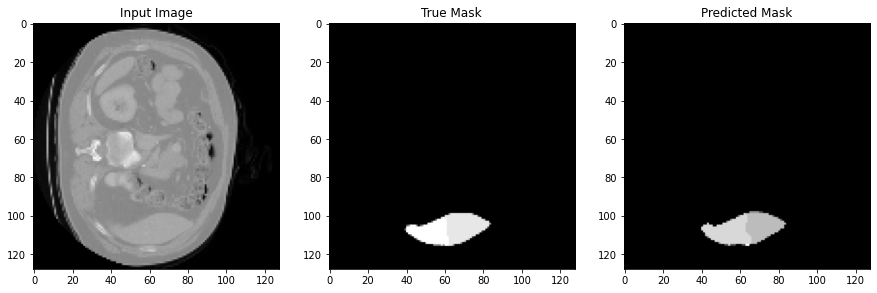

Instance in test dataset:  11


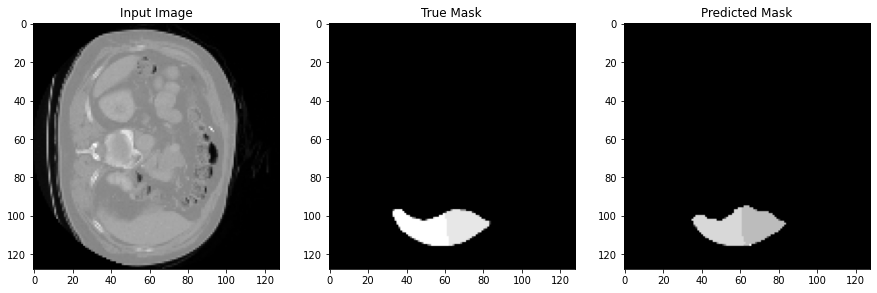

Instance in test dataset:  12


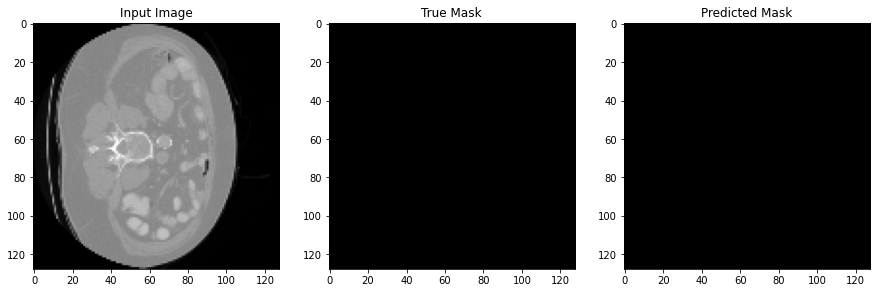

Instance in test dataset:  13


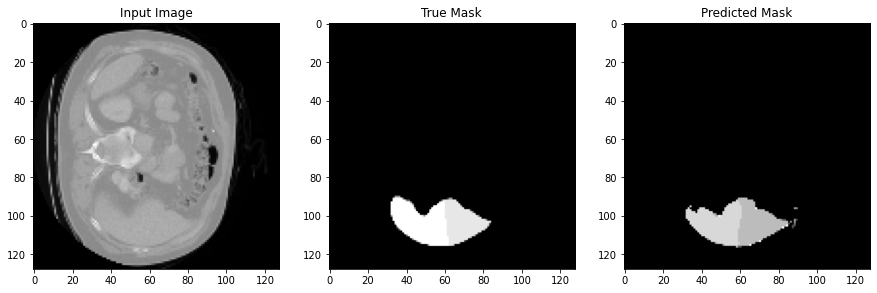

Instance in test dataset:  14


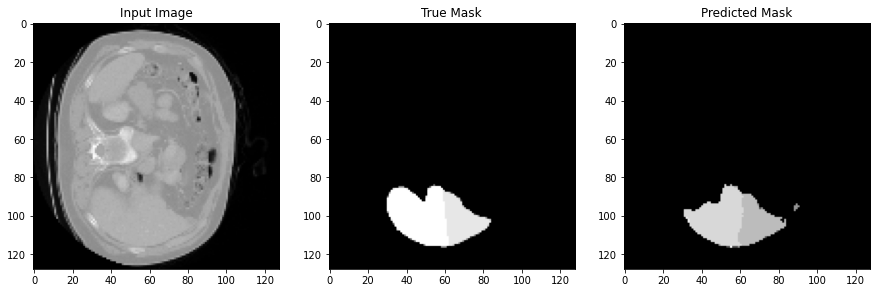

Instance in test dataset:  15


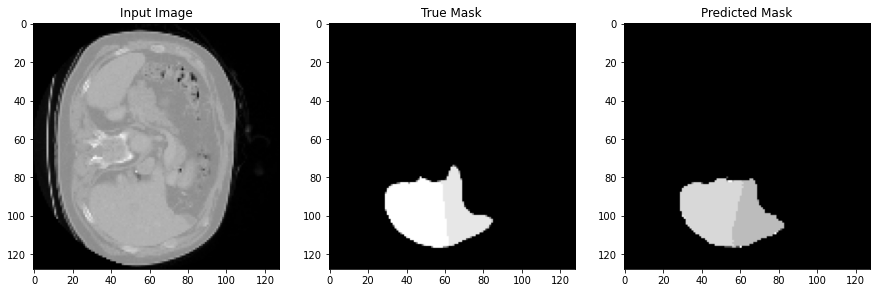

Instance in test dataset:  16


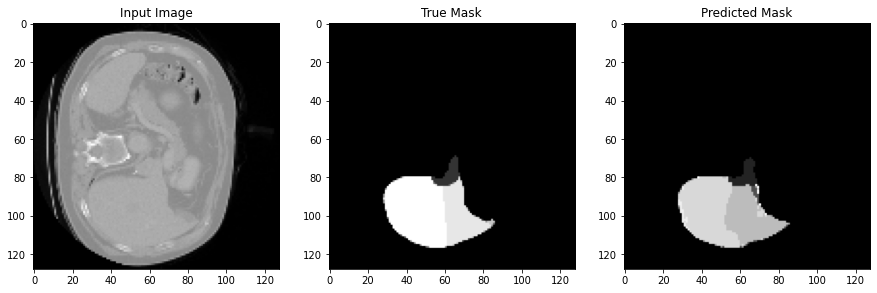

Instance in test dataset:  17


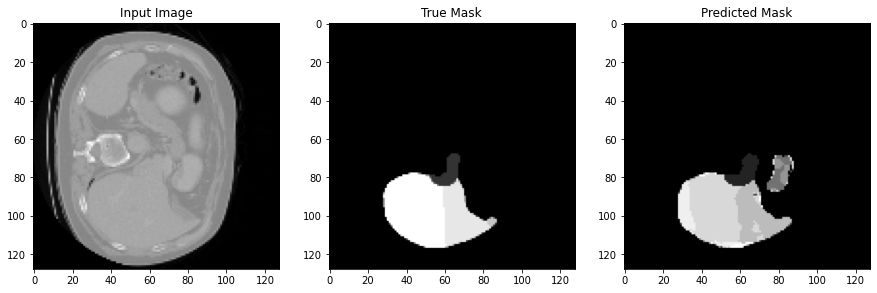

Instance in test dataset:  18


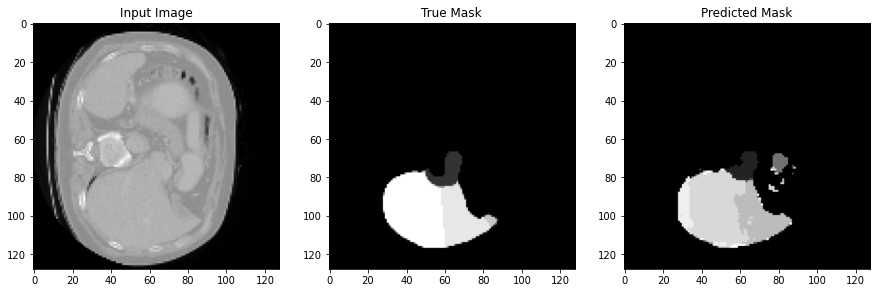

Instance in test dataset:  19


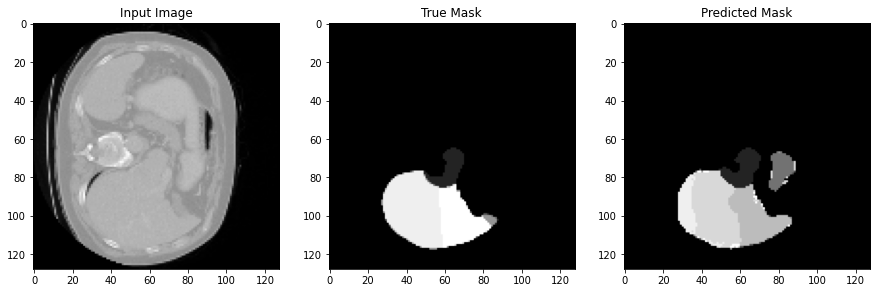

Instance in test dataset:  20


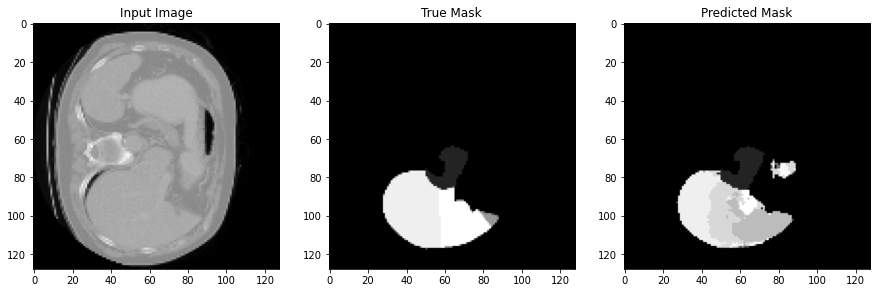

Instance in test dataset:  21


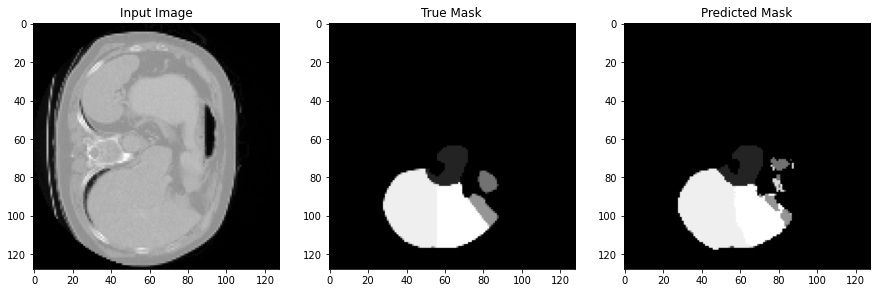

Instance in test dataset:  22


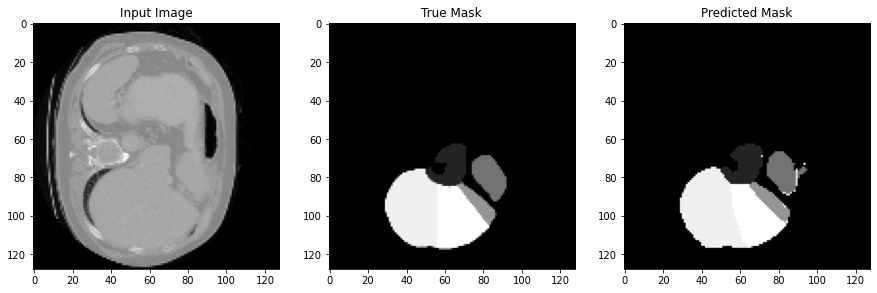

Instance in test dataset:  23


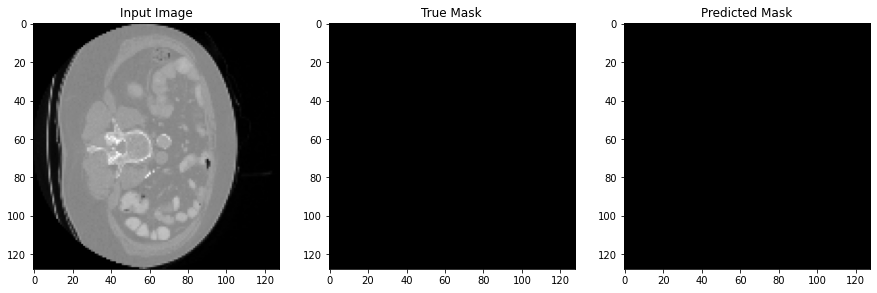

Instance in test dataset:  24


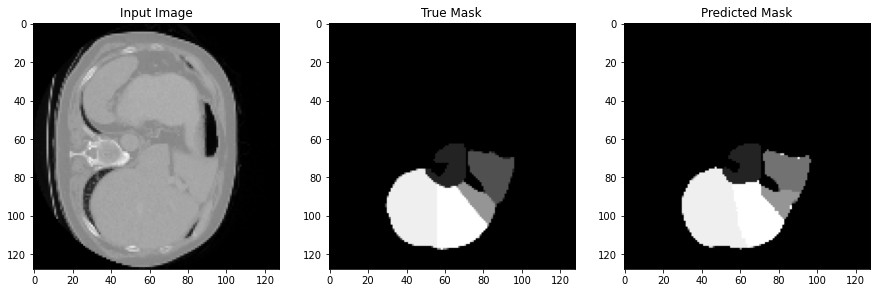

Instance in test dataset:  25


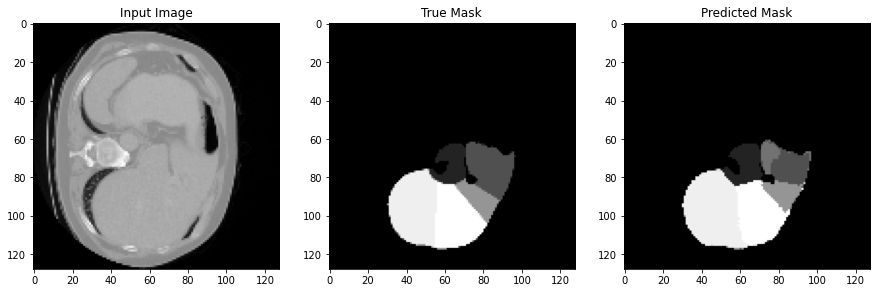

Instance in test dataset:  26


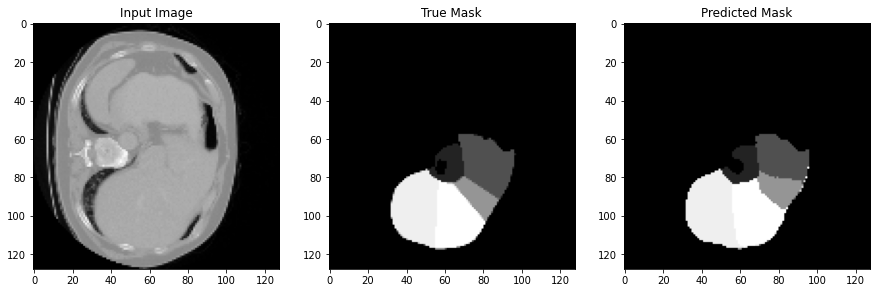

Instance in test dataset:  27


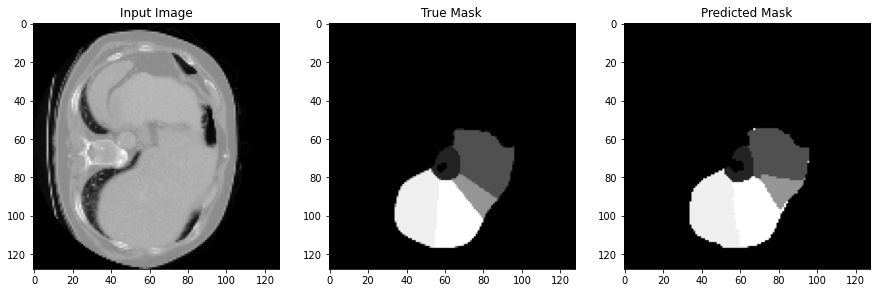

Instance in test dataset:  28


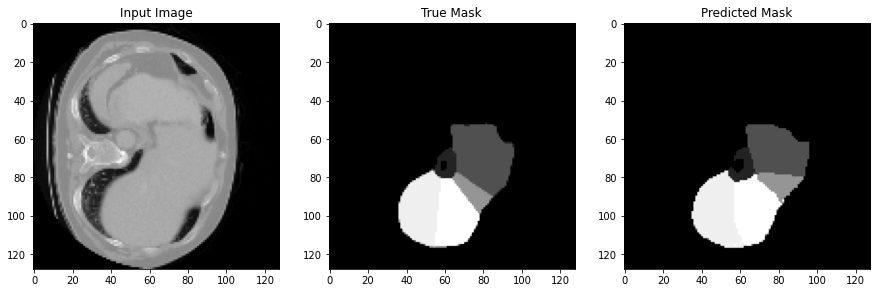

Instance in test dataset:  29


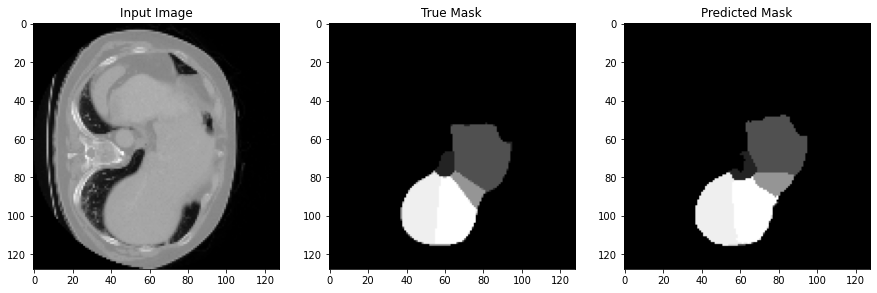

Instance in test dataset:  30


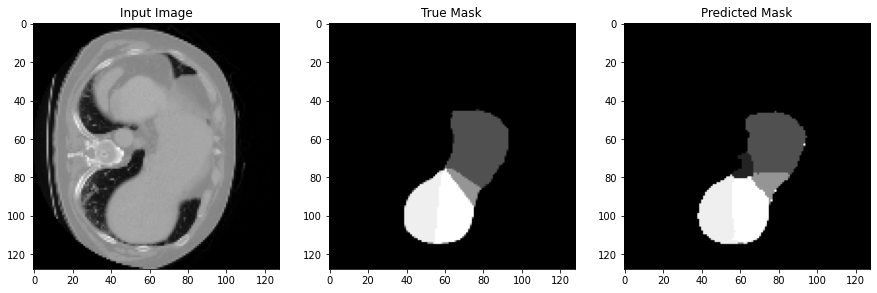

Instance in test dataset:  31


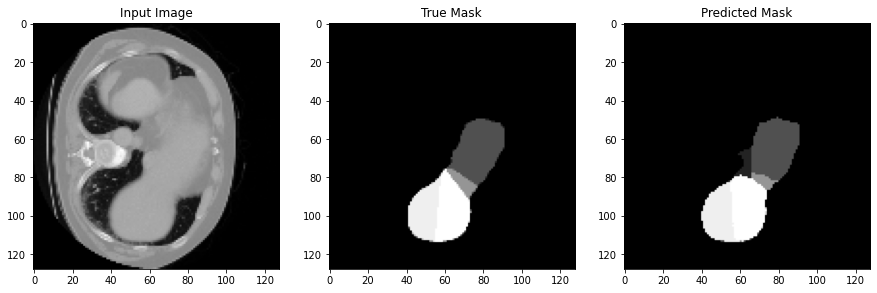

Instance in test dataset:  32


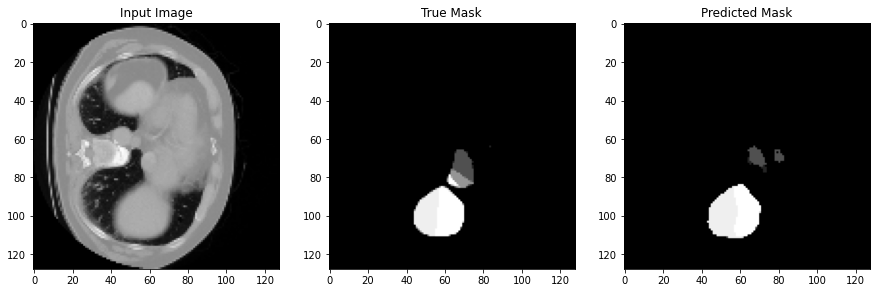

Instance in test dataset:  33


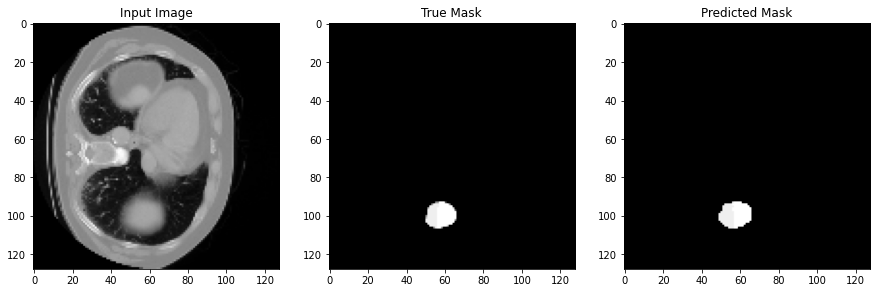

Instance in test dataset:  34


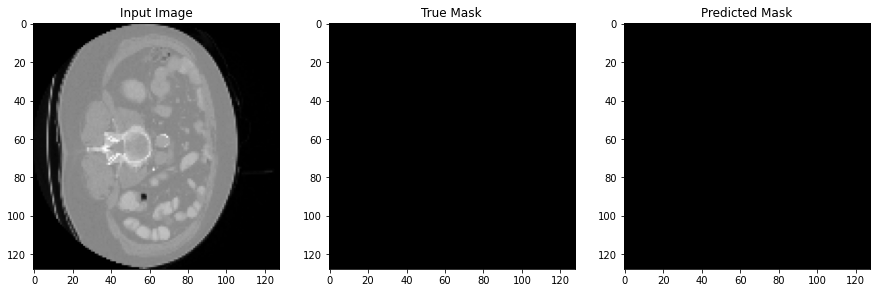

Instance in test dataset:  35


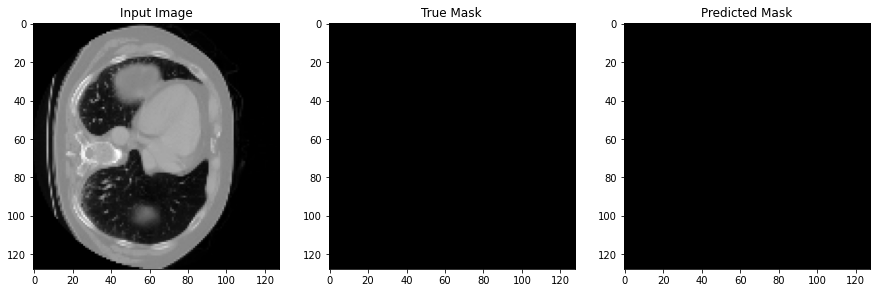

Instance in test dataset:  36


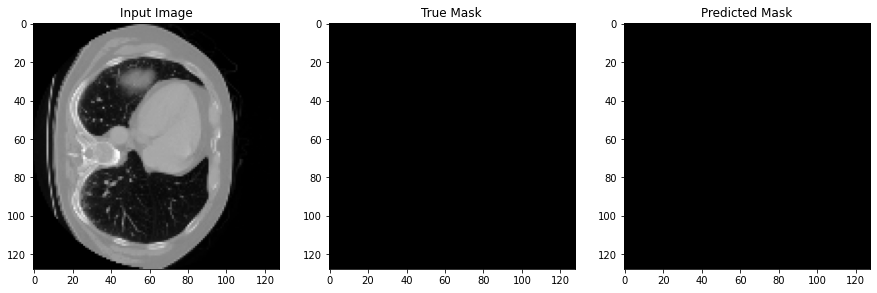

Instance in test dataset:  37


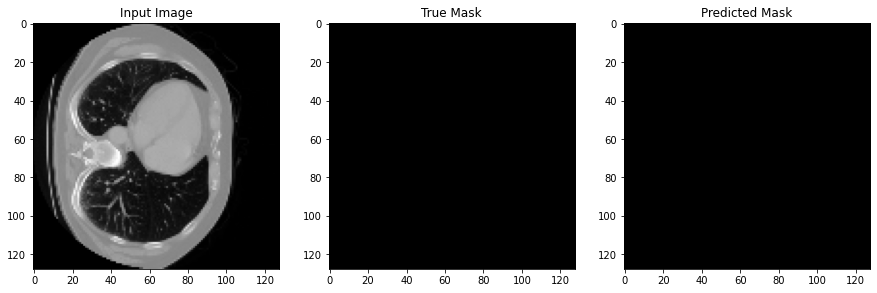

Instance in test dataset:  38


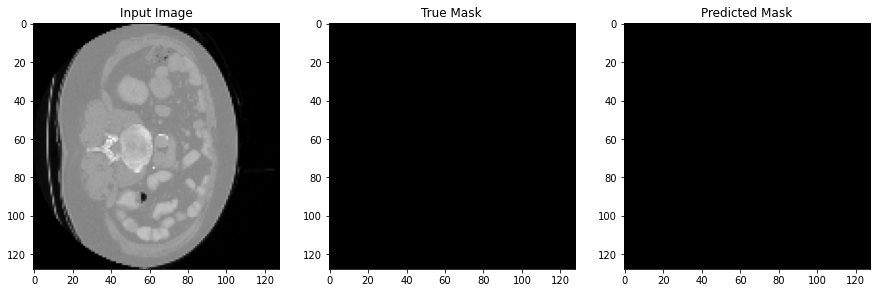

Instance in test dataset:  39


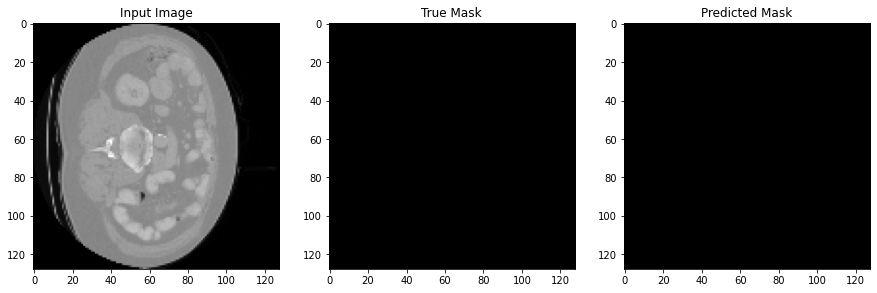

Instance in test dataset:  40


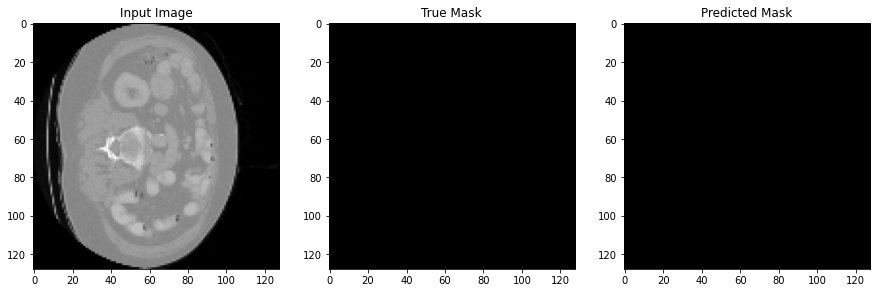

Instance in test dataset:  41


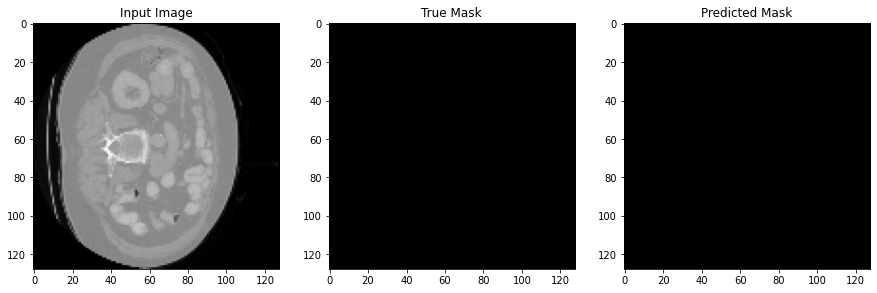

Instance in test dataset:  42


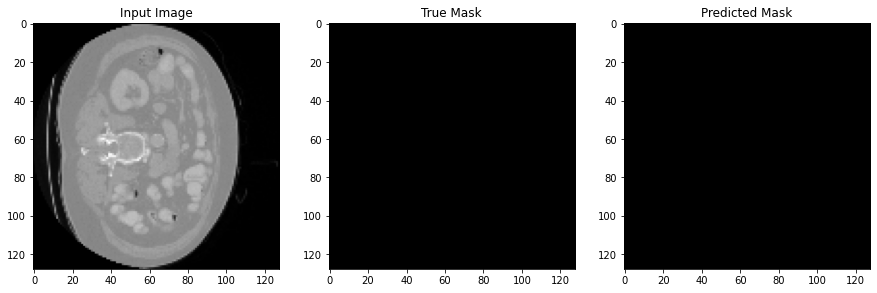

Instance in test dataset:  43


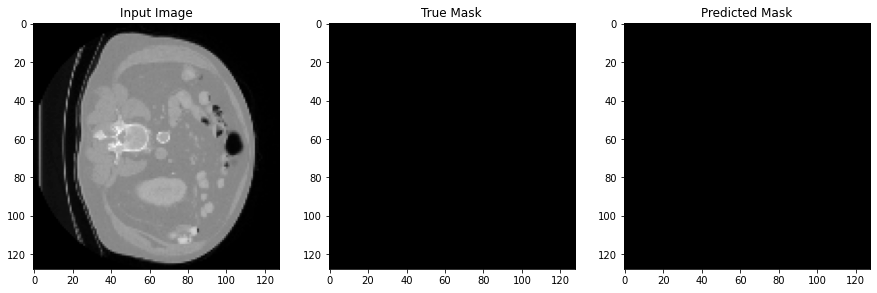

Instance in test dataset:  44


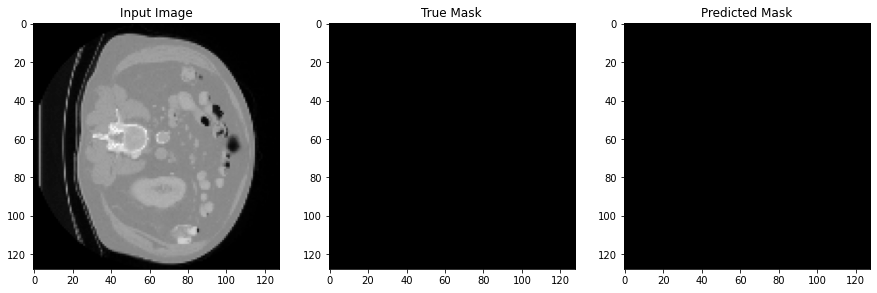

Instance in test dataset:  45


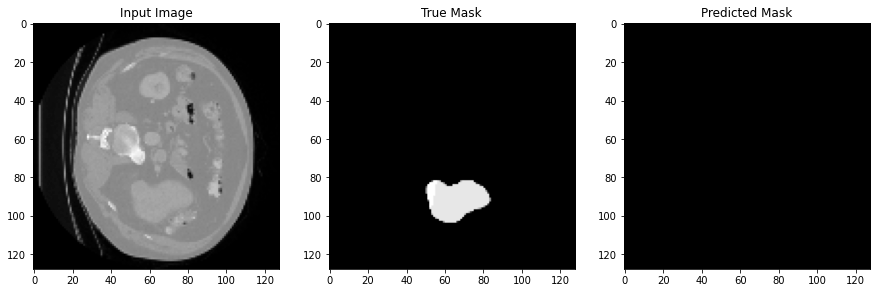

Instance in test dataset:  46


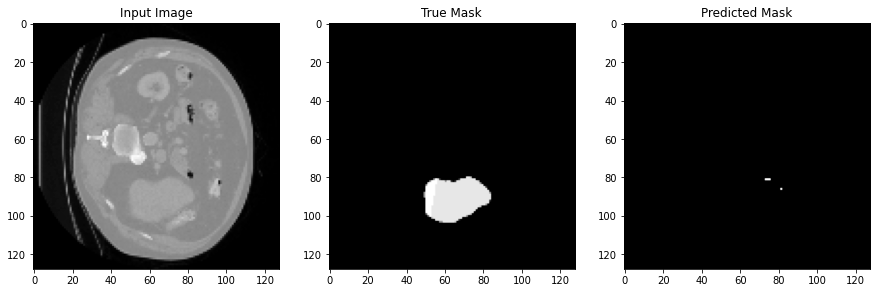

Instance in test dataset:  47


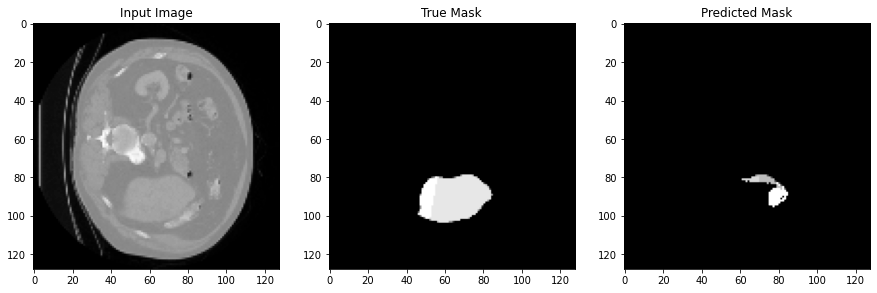

Instance in test dataset:  48


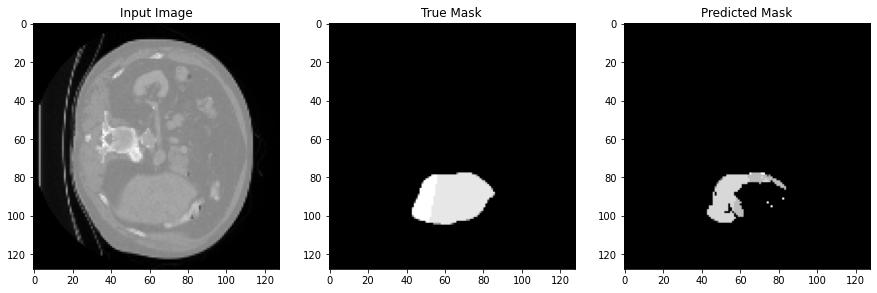

Instance in test dataset:  49


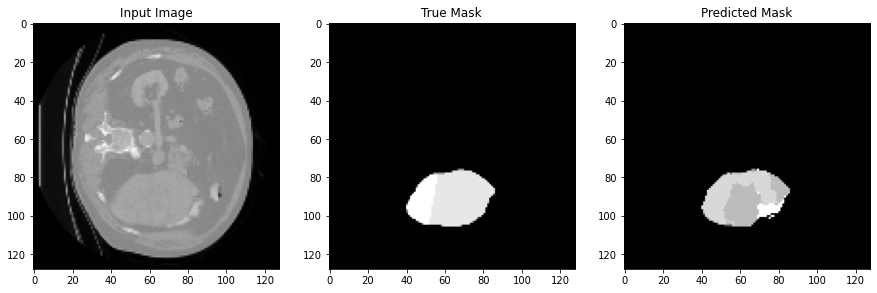

Instance in test dataset:  50


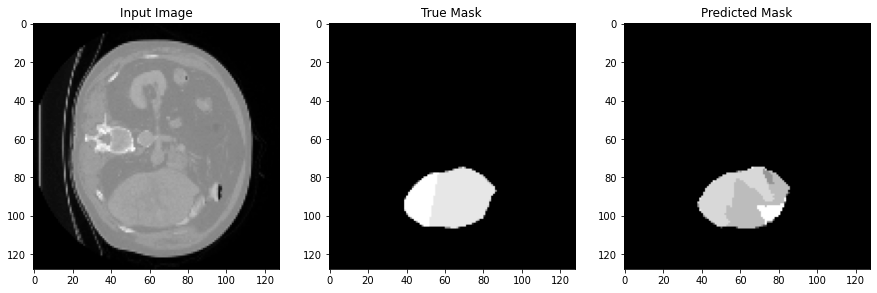

Instance in test dataset:  51


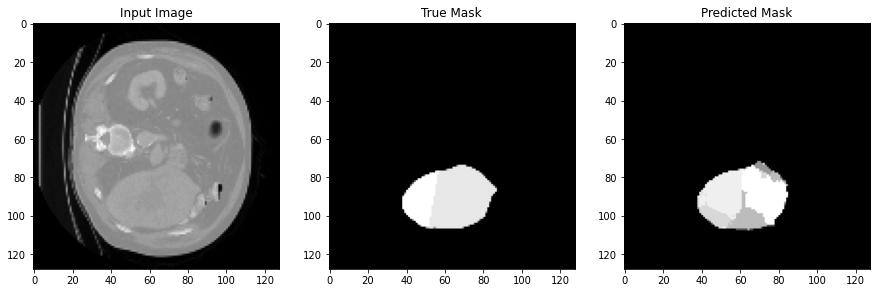

Instance in test dataset:  52


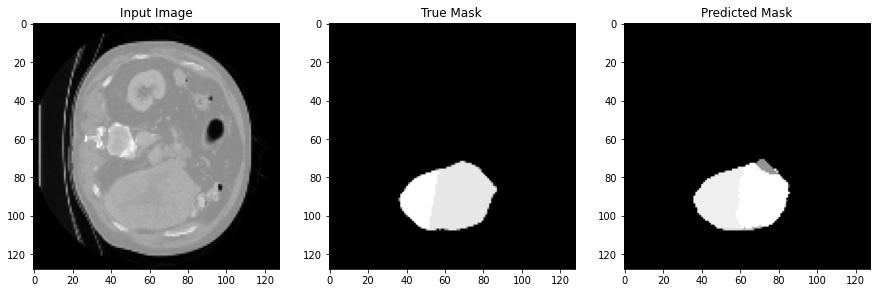

Instance in test dataset:  53


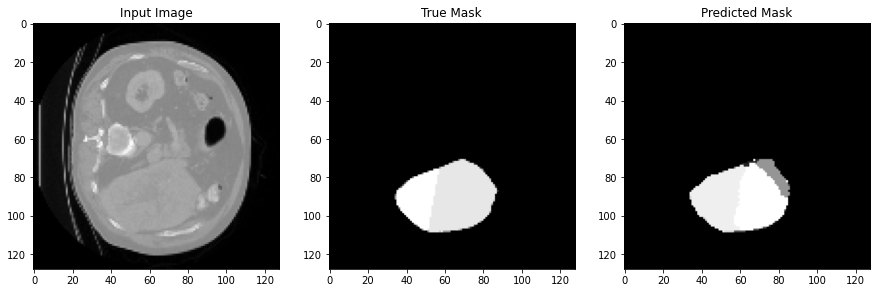

Instance in test dataset:  54


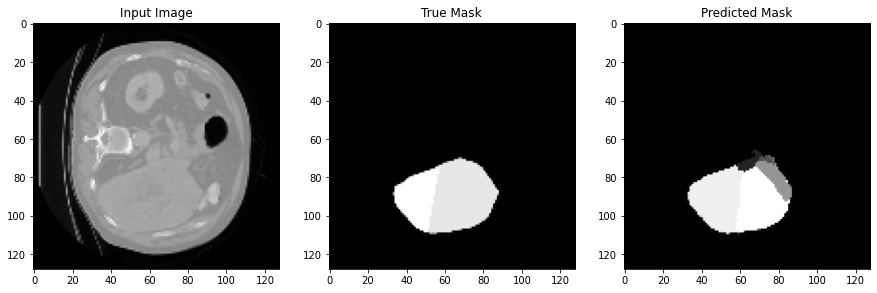

Instance in test dataset:  55


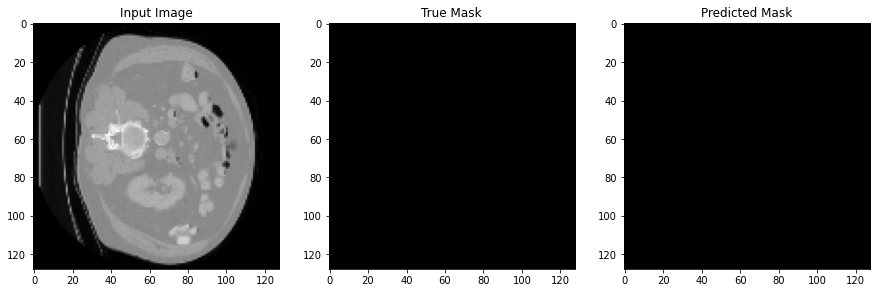

Instance in test dataset:  56


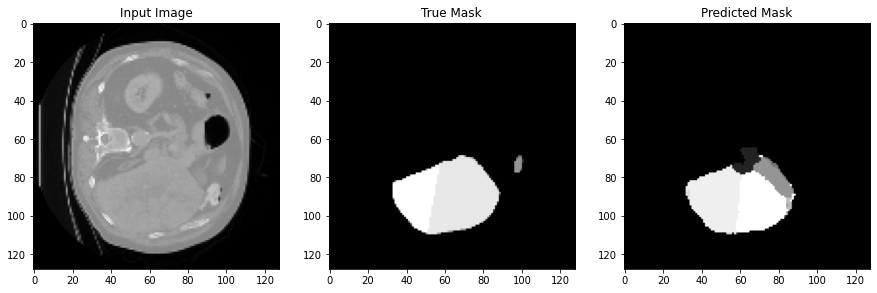

Instance in test dataset:  57


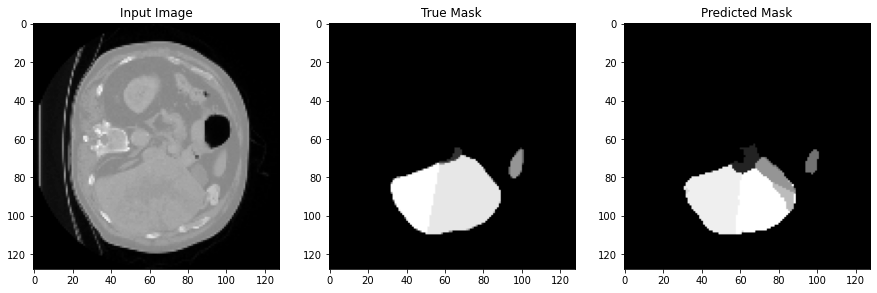

Instance in test dataset:  58


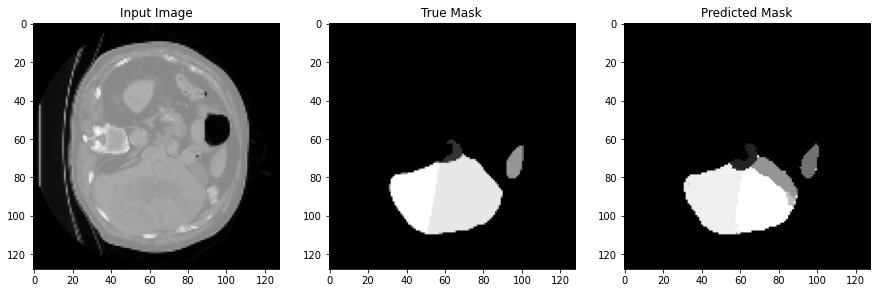

Instance in test dataset:  59


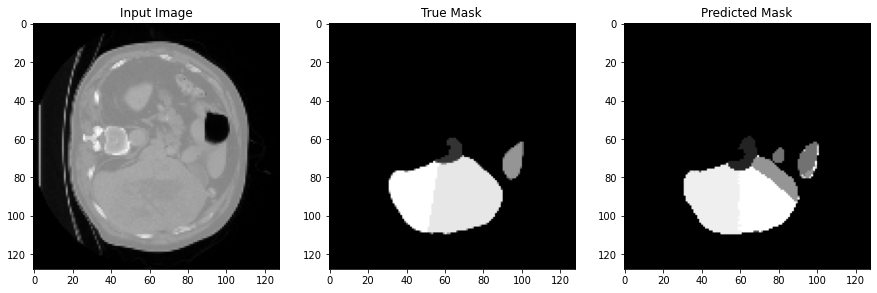

Instance in test dataset:  60


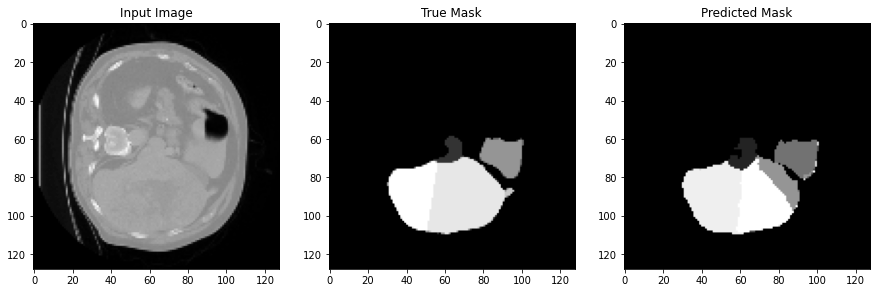

Instance in test dataset:  61


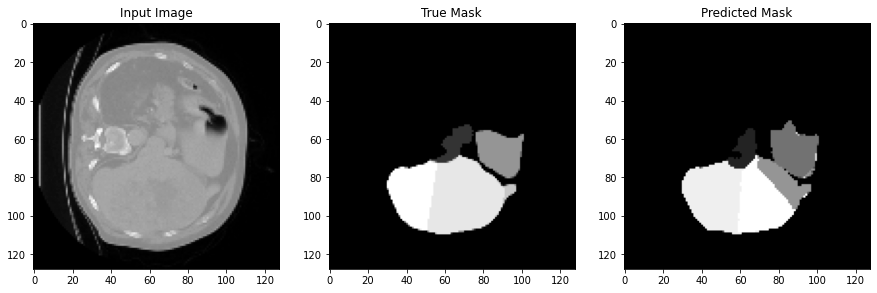

Instance in test dataset:  62


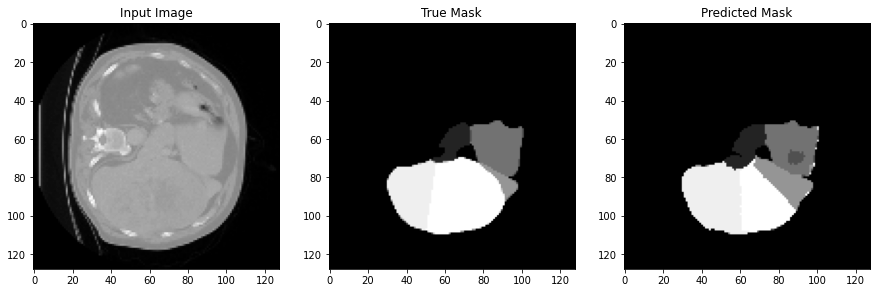

Instance in test dataset:  63


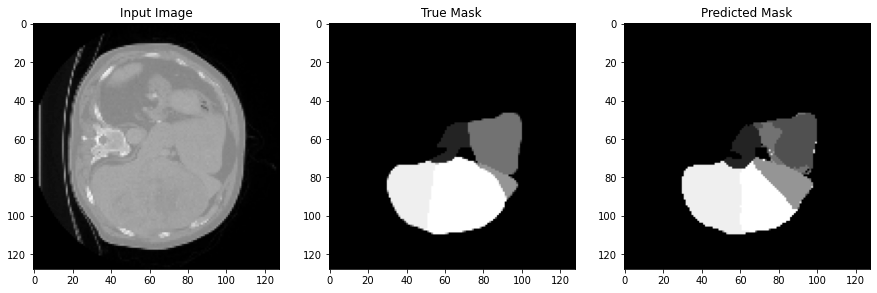

Instance in test dataset:  64


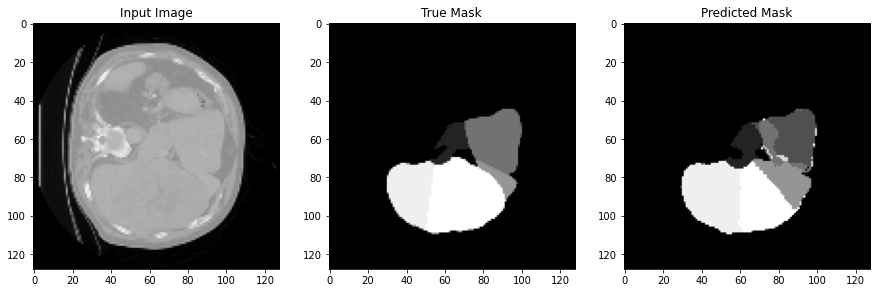

Instance in test dataset:  65


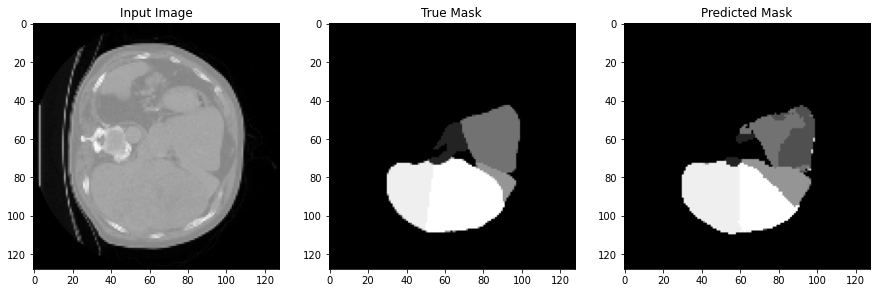

Instance in test dataset:  66


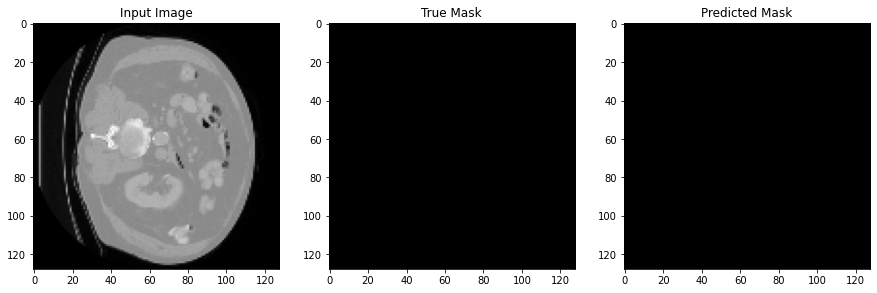

Instance in test dataset:  67


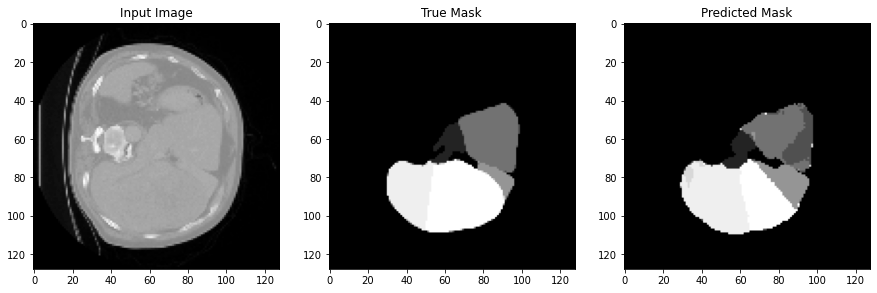

Instance in test dataset:  68


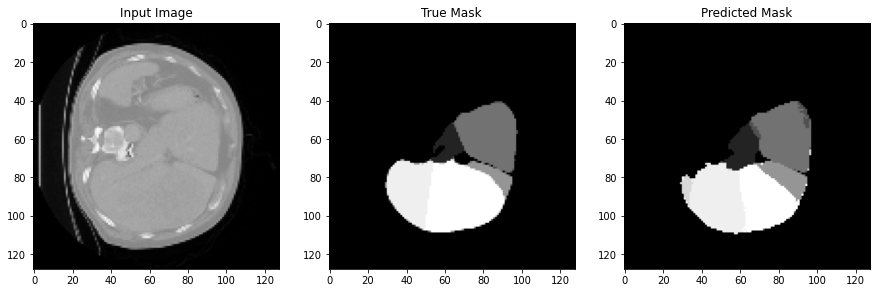

Instance in test dataset:  69


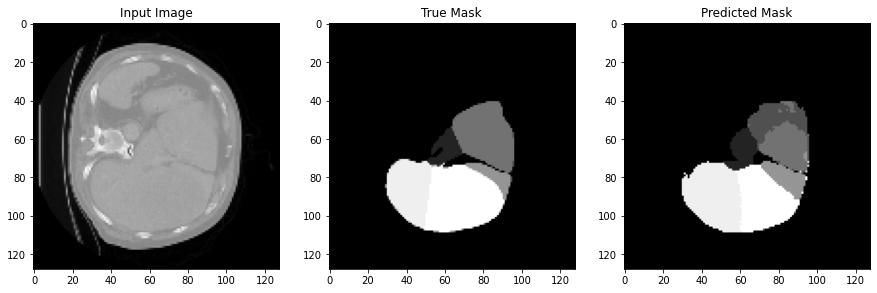

Instance in test dataset:  70


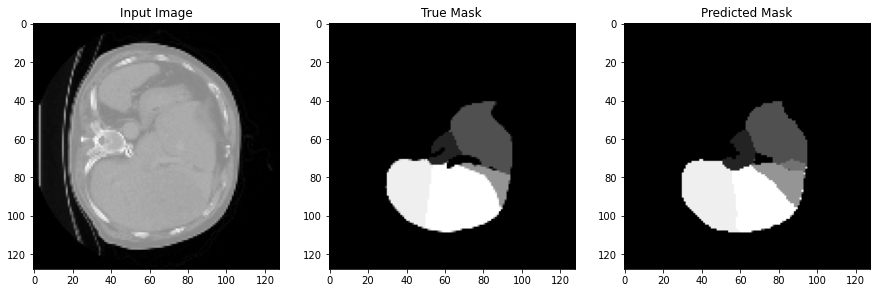

Instance in test dataset:  71


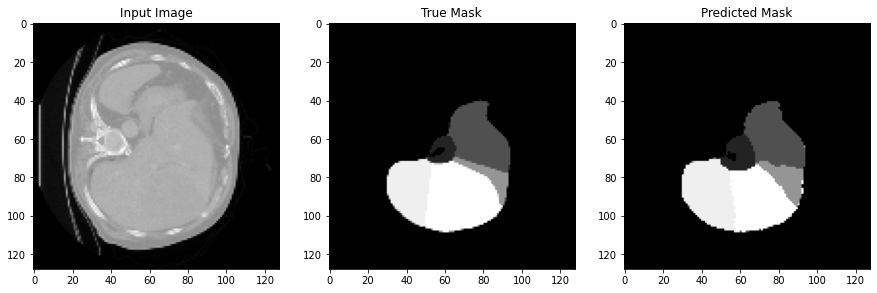

Instance in test dataset:  72


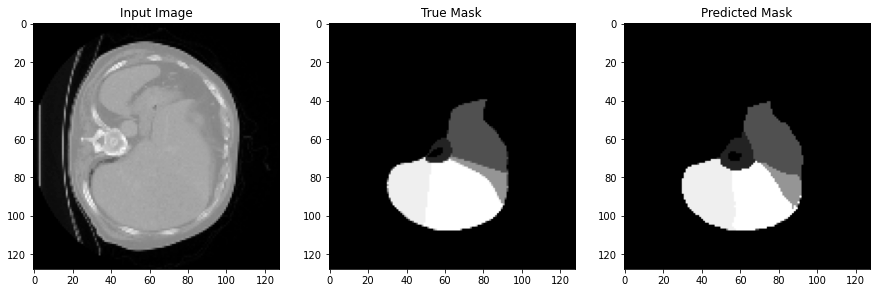

Instance in test dataset:  73


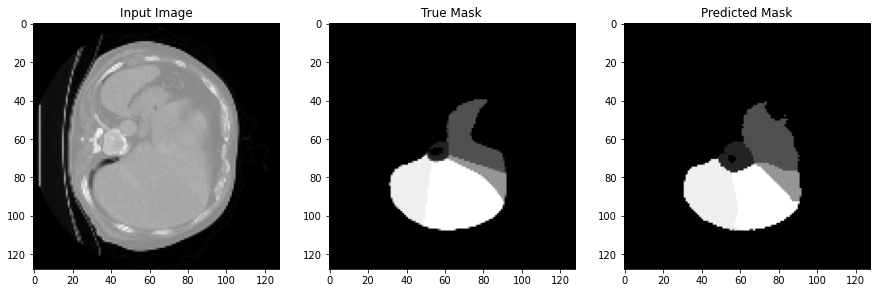

Instance in test dataset:  74


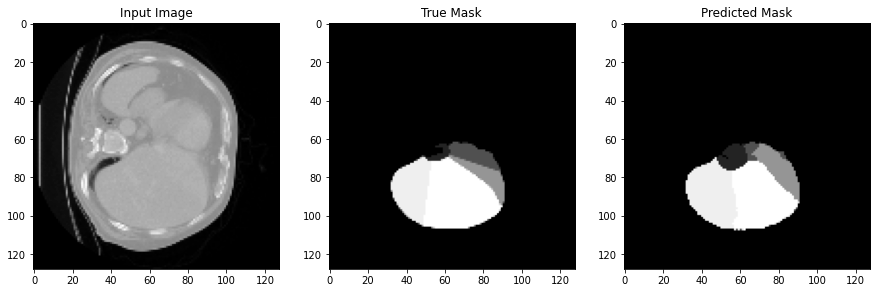

Instance in test dataset:  75


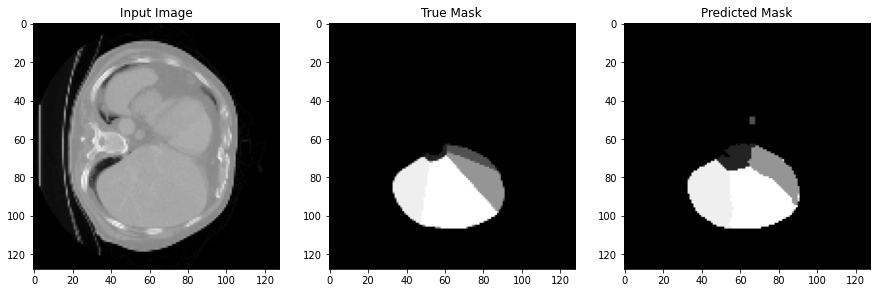

Instance in test dataset:  76


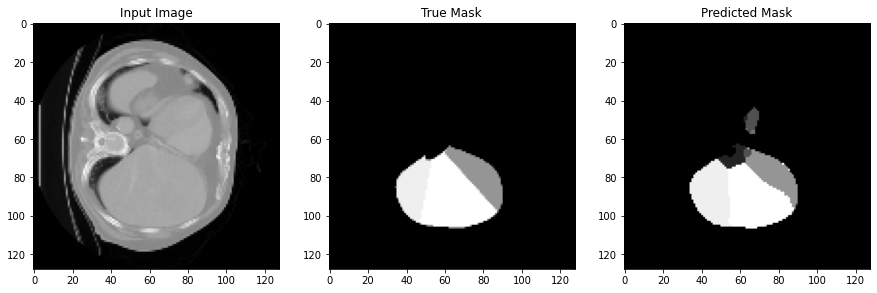

Instance in test dataset:  77


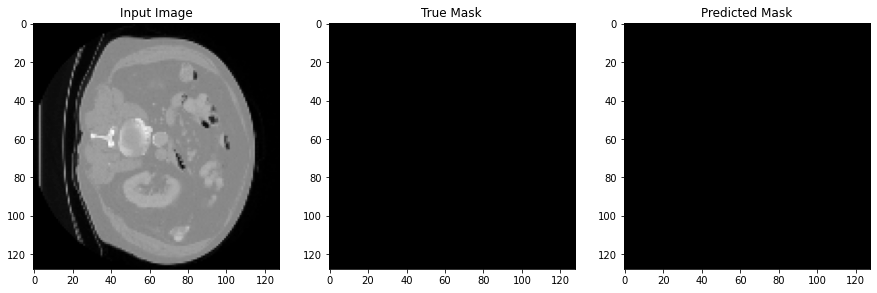

Instance in test dataset:  78


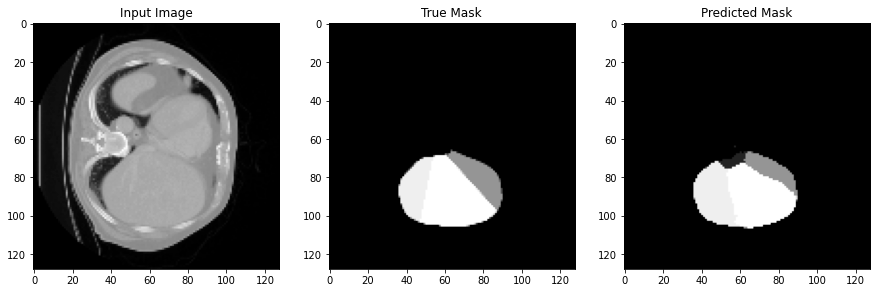

Instance in test dataset:  79


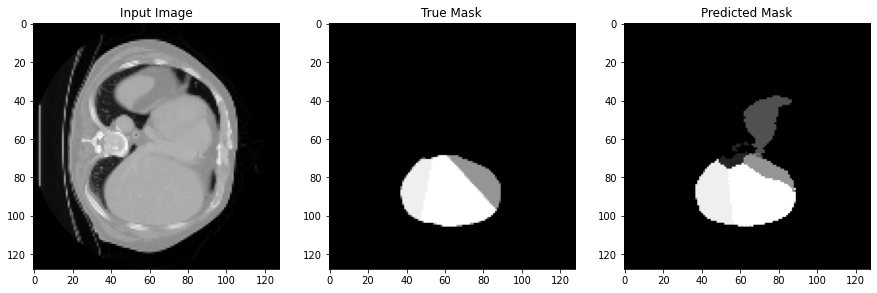

Instance in test dataset:  80


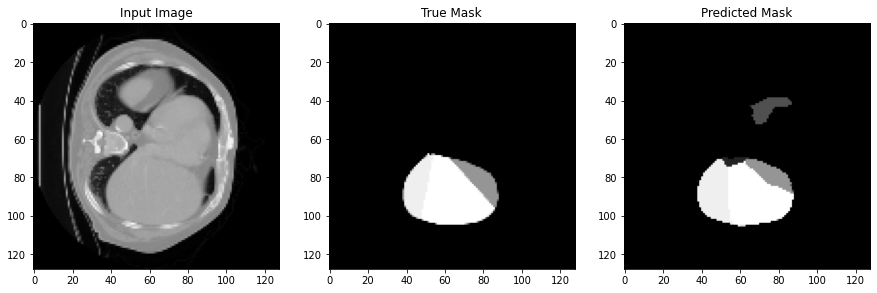

Instance in test dataset:  81


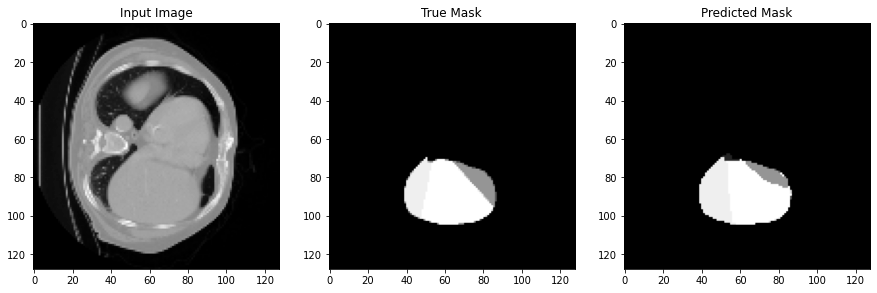

Instance in test dataset:  82


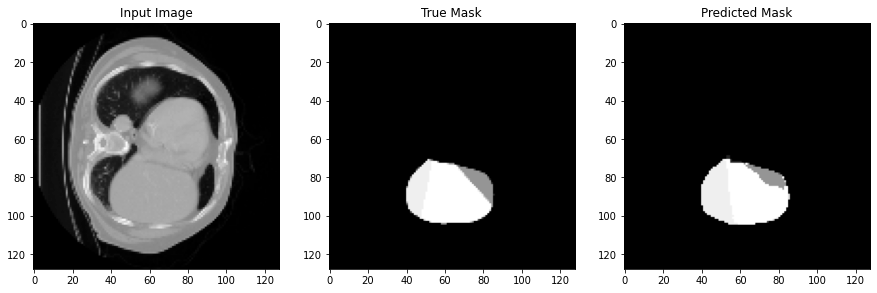

Instance in test dataset:  83


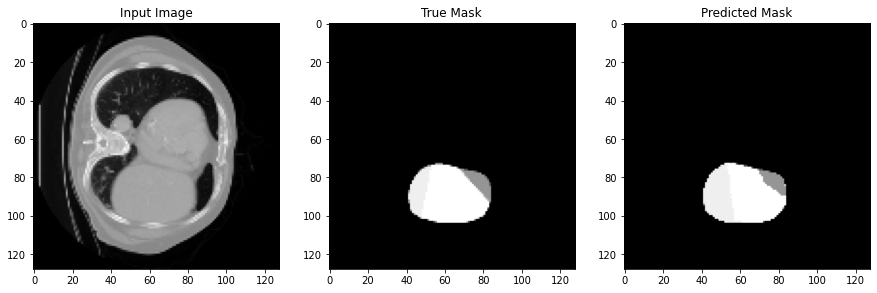

Instance in test dataset:  84


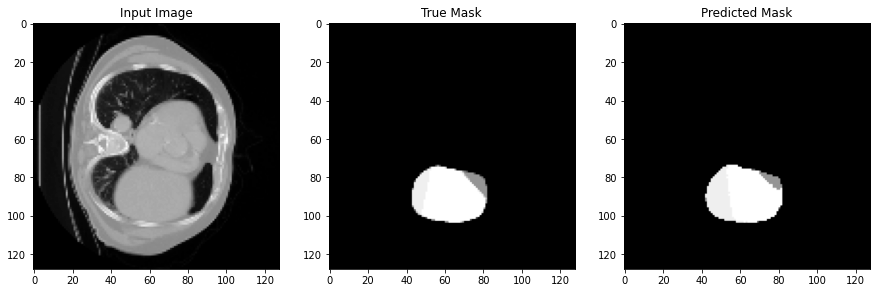

Instance in test dataset:  85


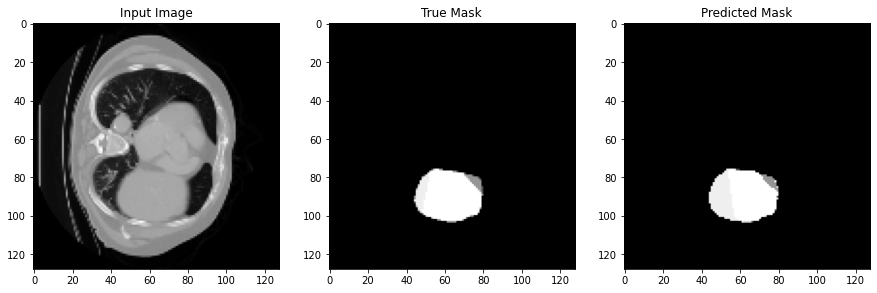

Instance in test dataset:  86


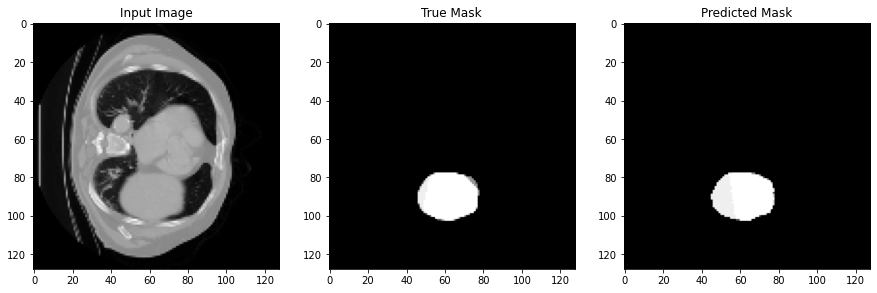

Instance in test dataset:  87


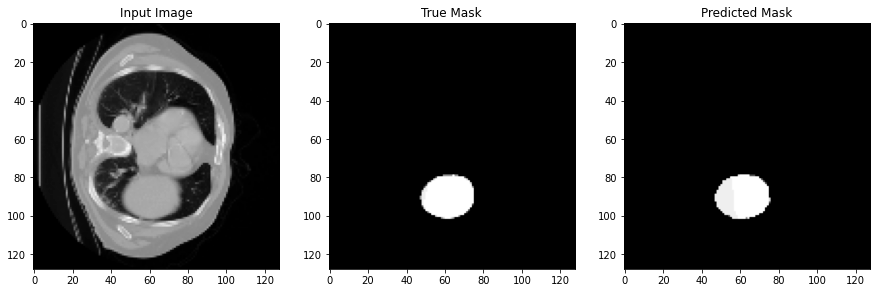

Instance in test dataset:  88


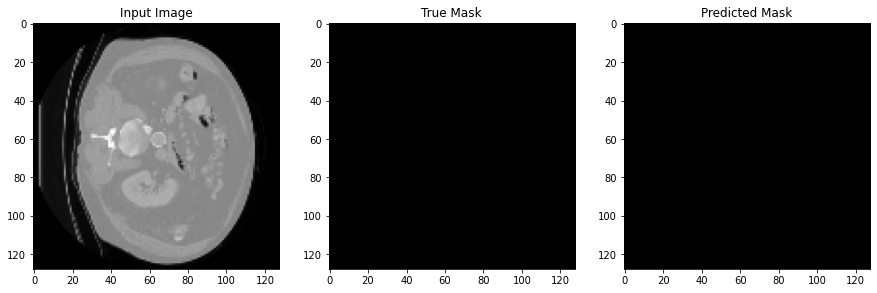

Instance in test dataset:  89


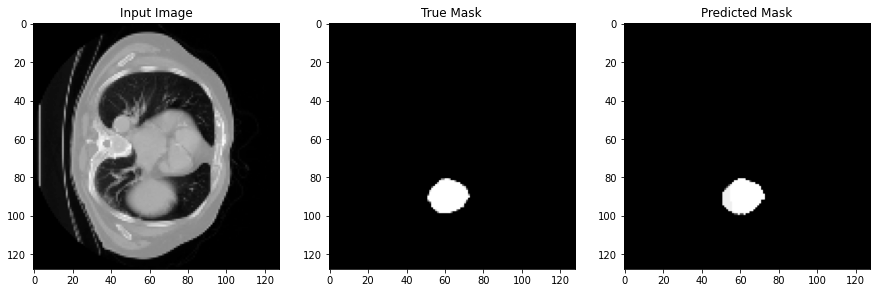

Instance in test dataset:  90


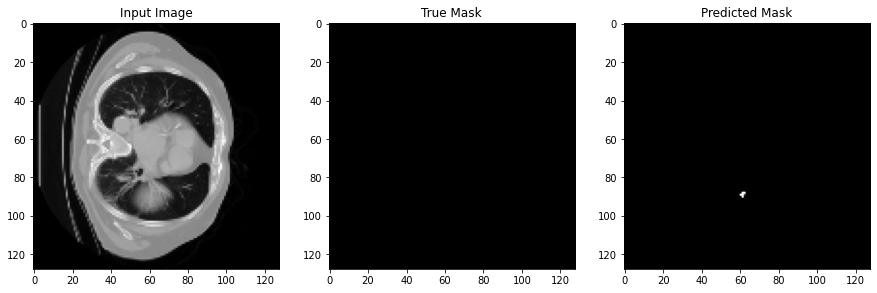

Instance in test dataset:  91


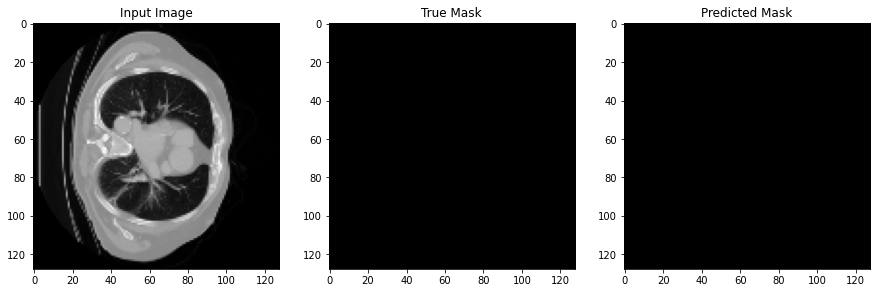

Instance in test dataset:  92


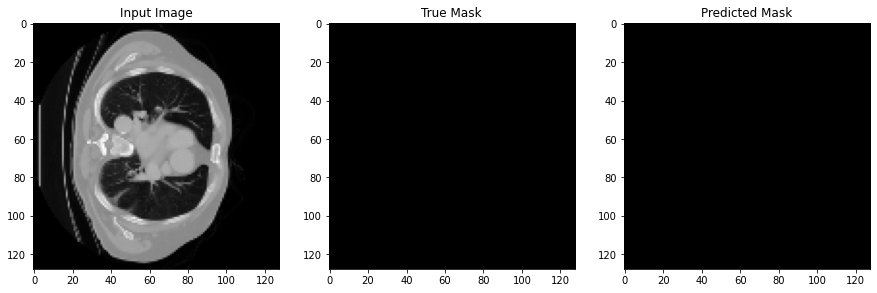

Instance in test dataset:  93


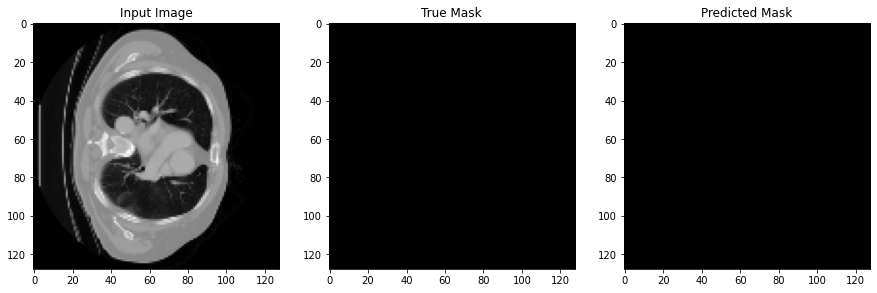

Instance in test dataset:  94


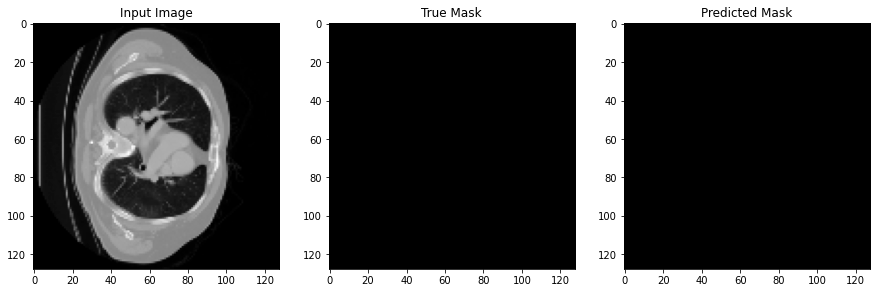

Instance in test dataset:  95


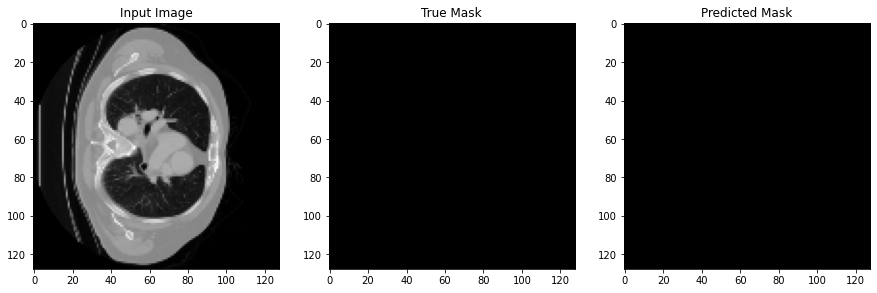

Instance in test dataset:  96


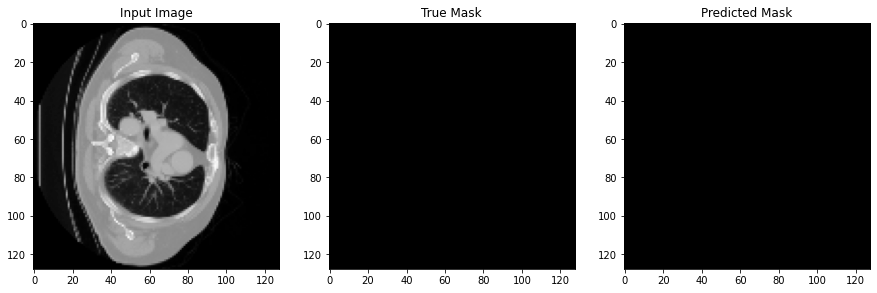

Instance in test dataset:  97


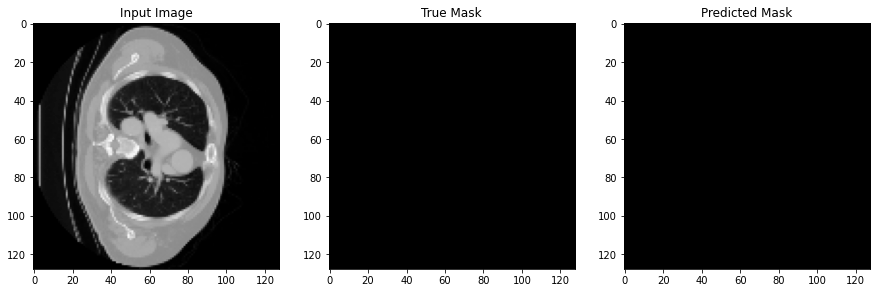

Instance in test dataset:  98


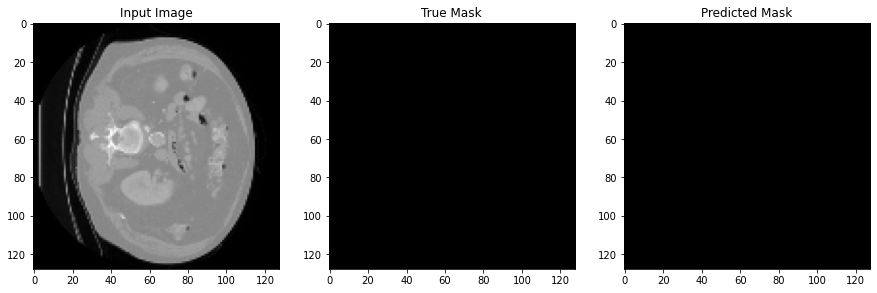

Instance in test dataset:  99


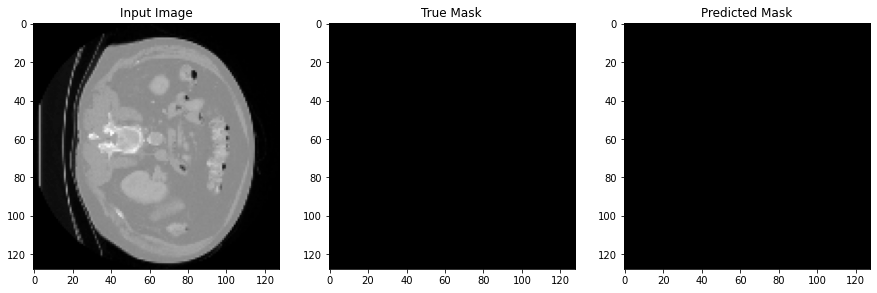

Instance in test dataset:  100


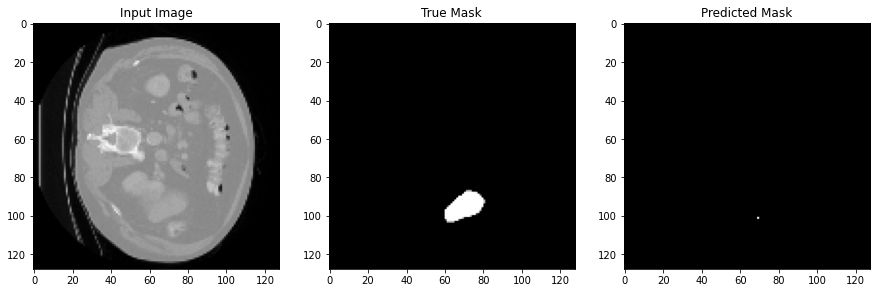

Instance in test dataset:  101


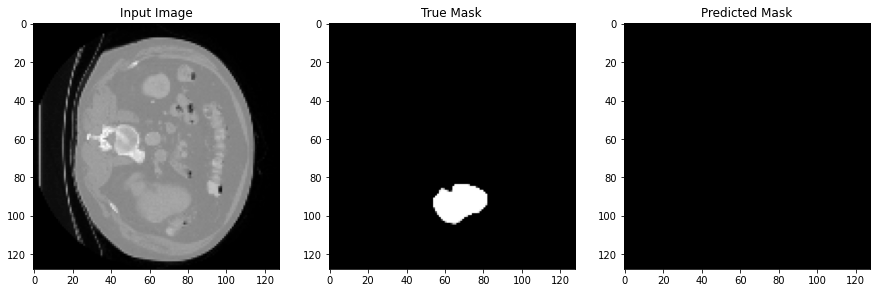

Instance in test dataset:  102


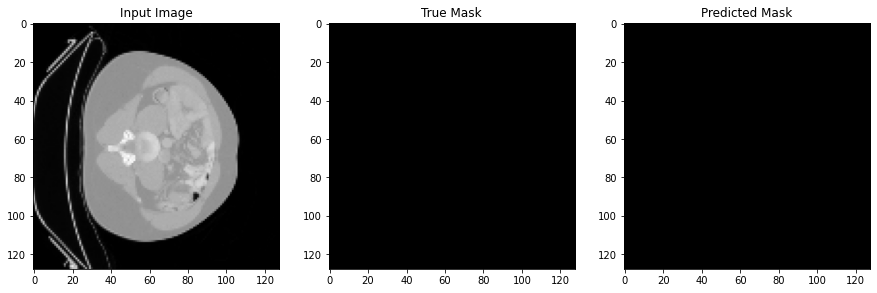

Instance in test dataset:  103


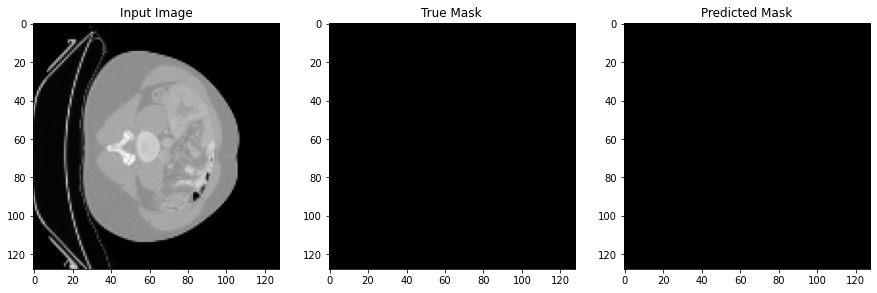

Instance in test dataset:  104


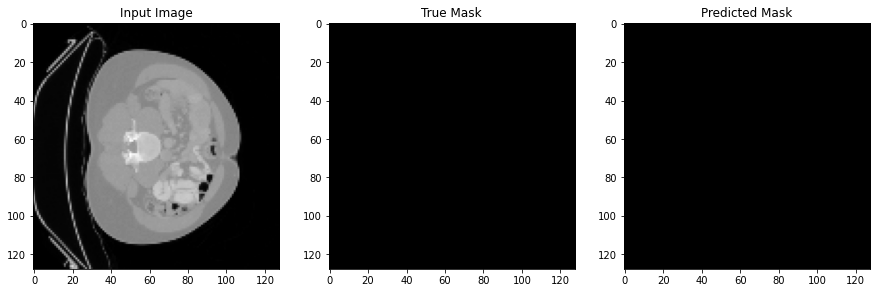

Instance in test dataset:  105


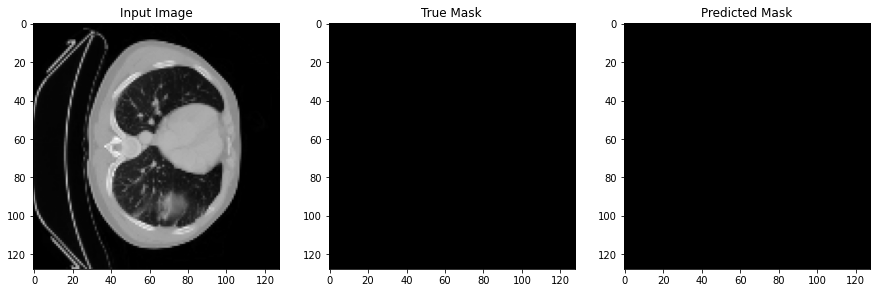

Instance in test dataset:  106


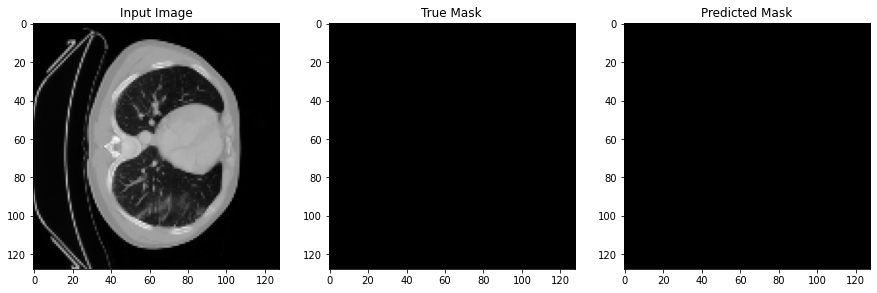

Instance in test dataset:  107


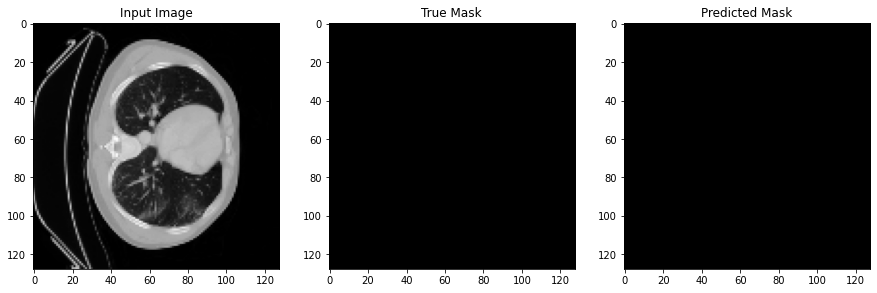

Instance in test dataset:  108


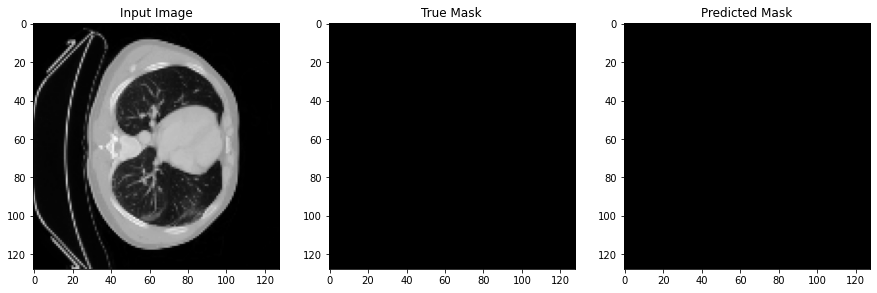

Instance in test dataset:  109


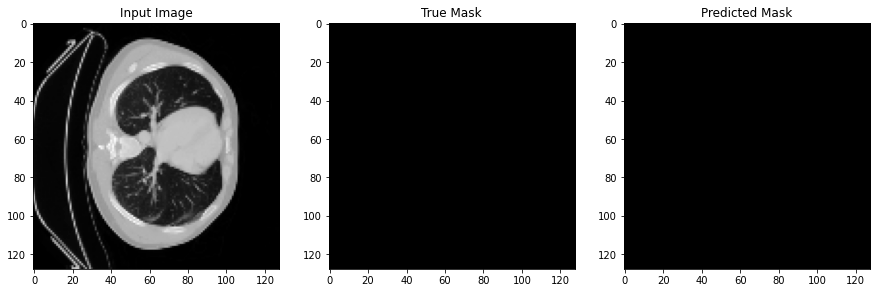

Instance in test dataset:  110


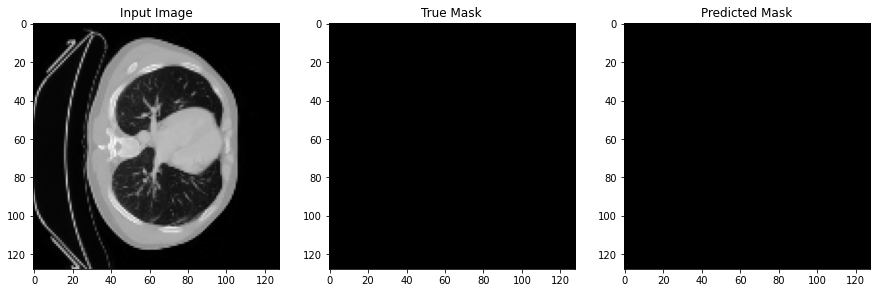

Instance in test dataset:  111


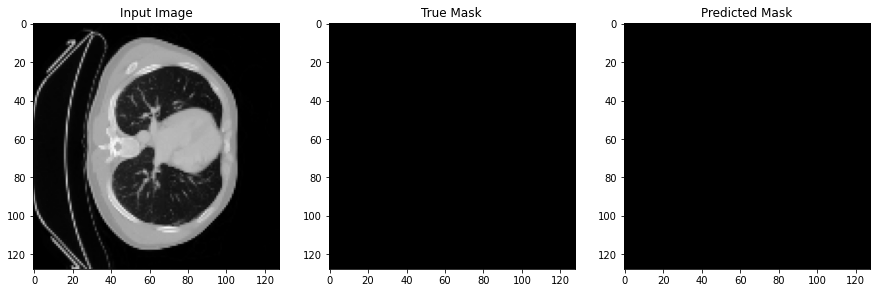

Instance in test dataset:  112


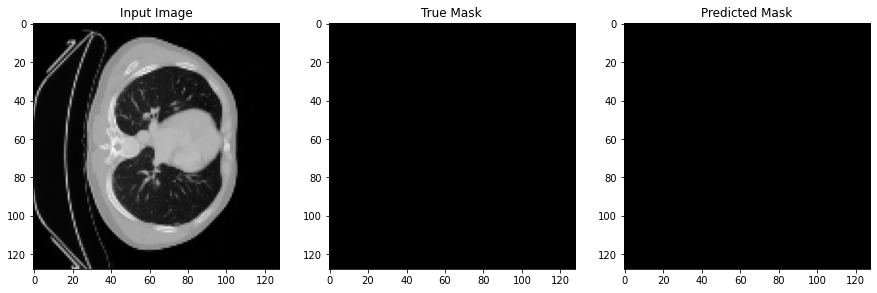

Instance in test dataset:  113


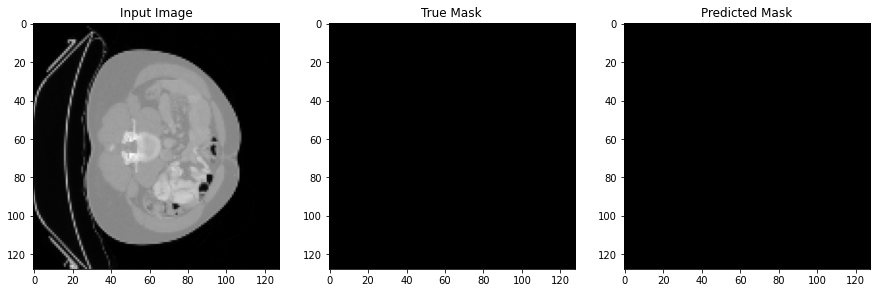

Instance in test dataset:  114


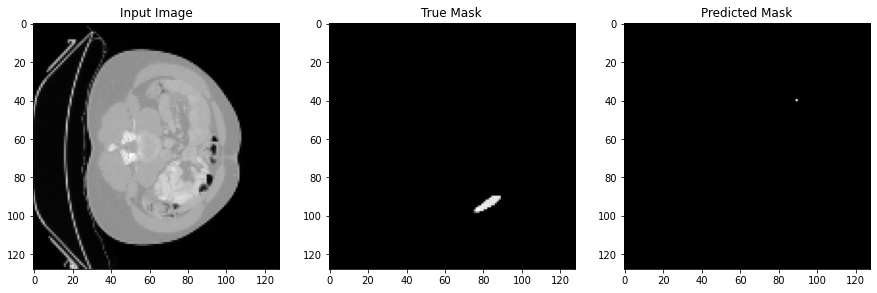

Instance in test dataset:  115


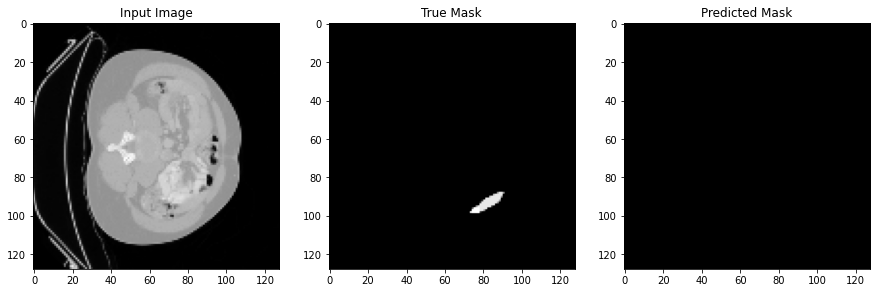

Instance in test dataset:  116


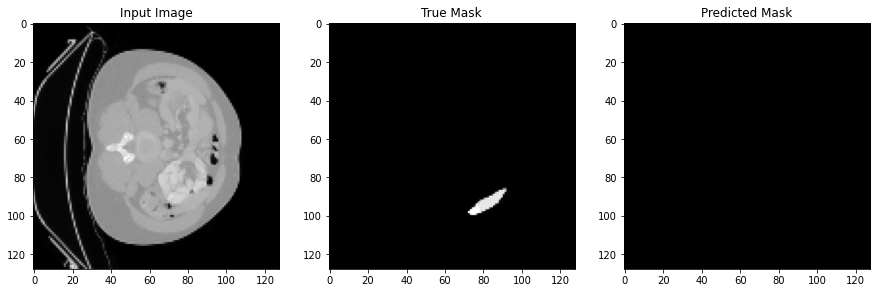

Instance in test dataset:  117


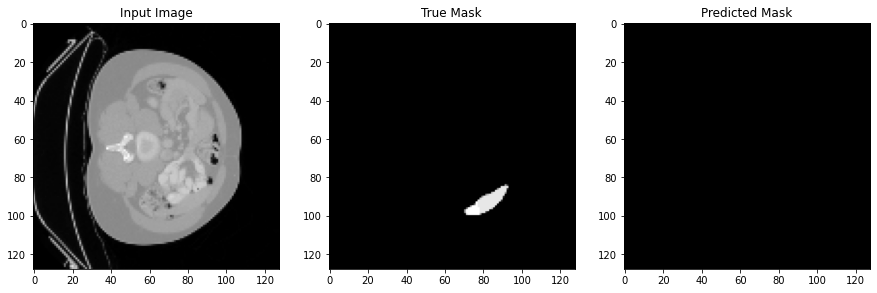

Instance in test dataset:  118


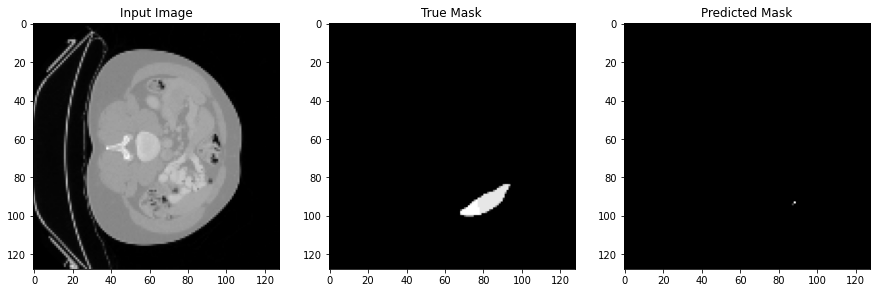

Instance in test dataset:  119


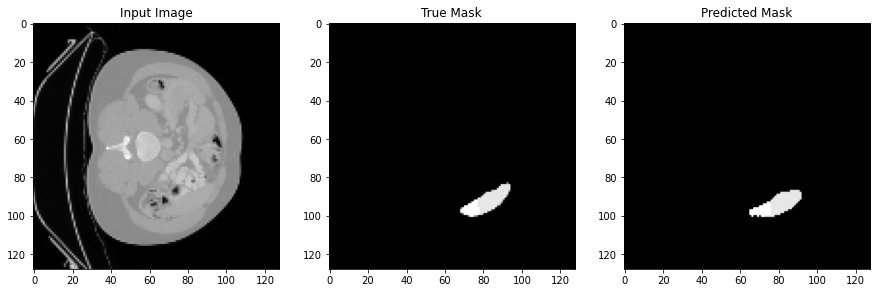

Instance in test dataset:  120


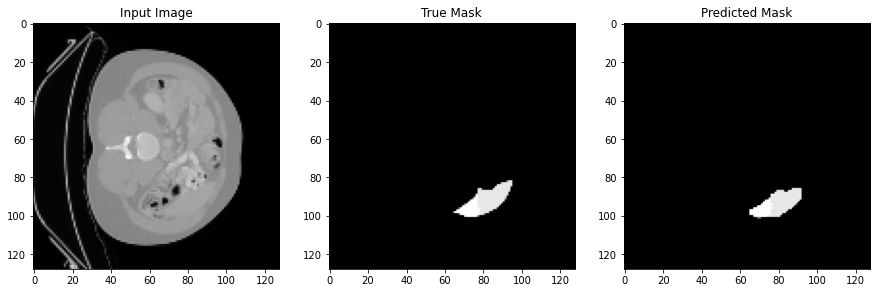

Instance in test dataset:  121


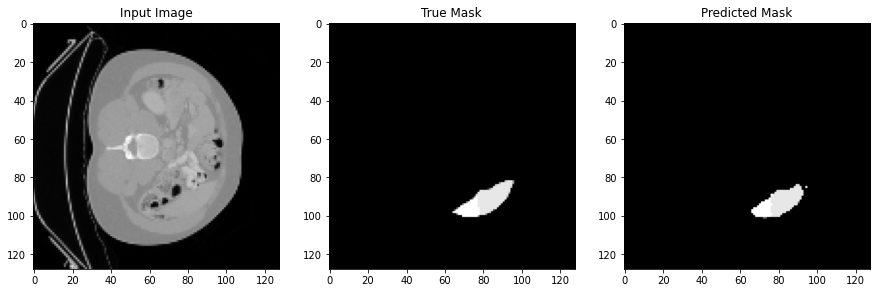

Instance in test dataset:  122


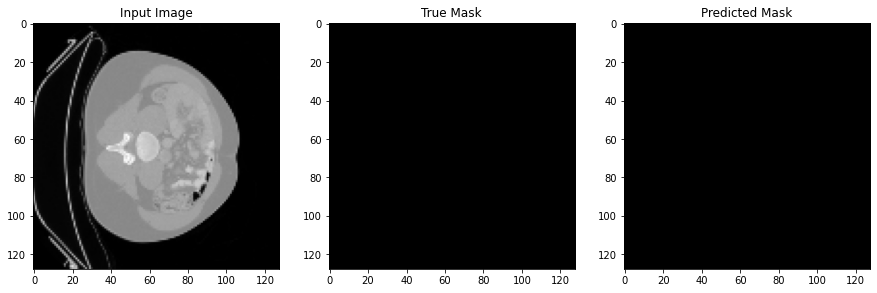

Instance in test dataset:  123


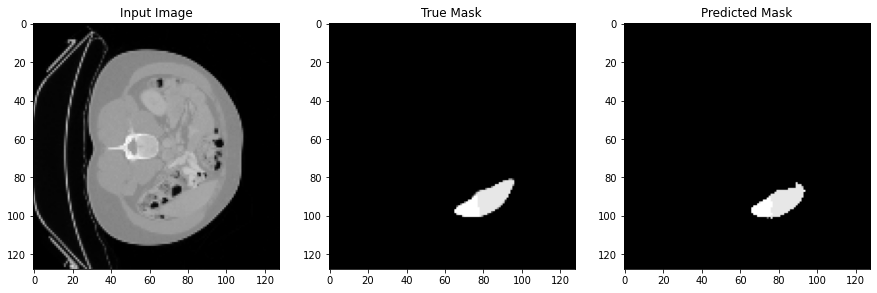

Instance in test dataset:  124


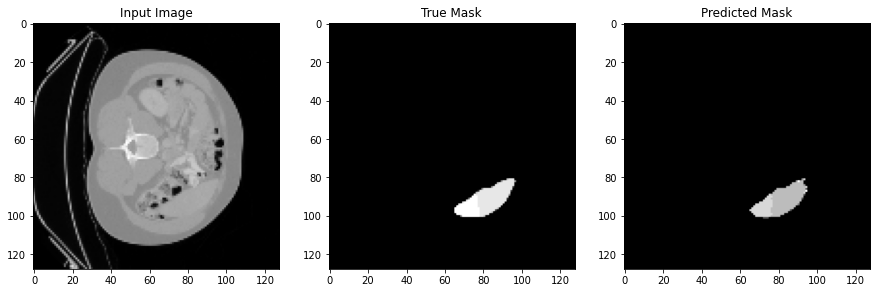

Instance in test dataset:  125


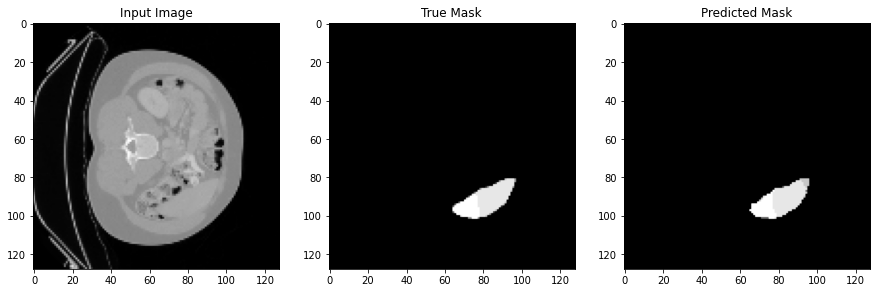

Instance in test dataset:  126


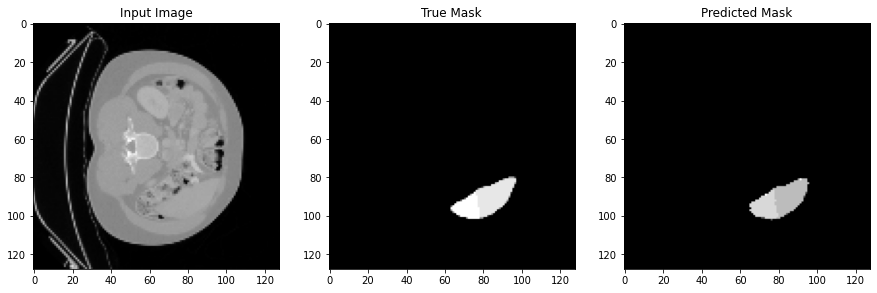

Instance in test dataset:  127


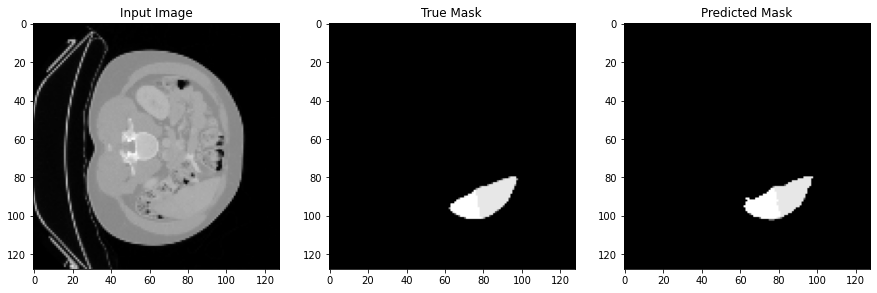

Instance in test dataset:  128


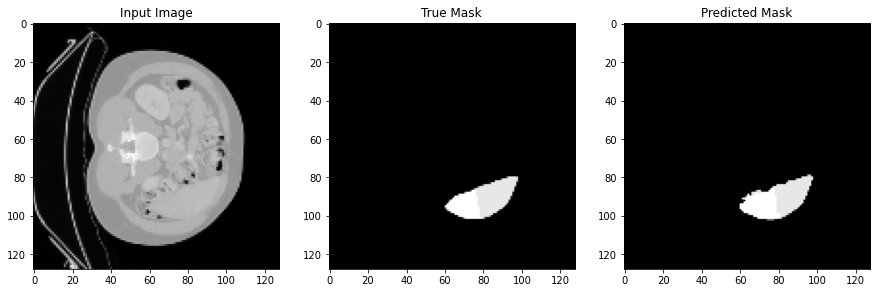

Instance in test dataset:  129


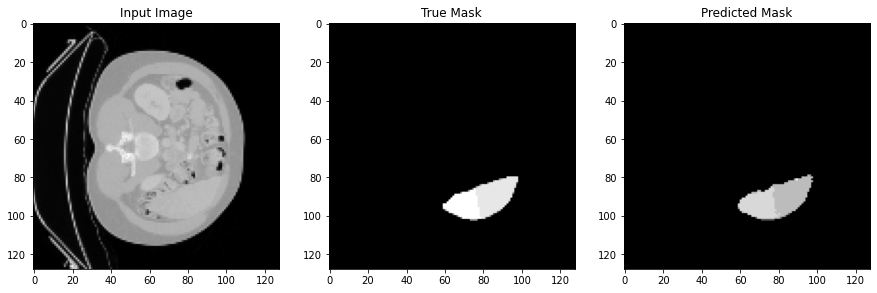

Instance in test dataset:  130


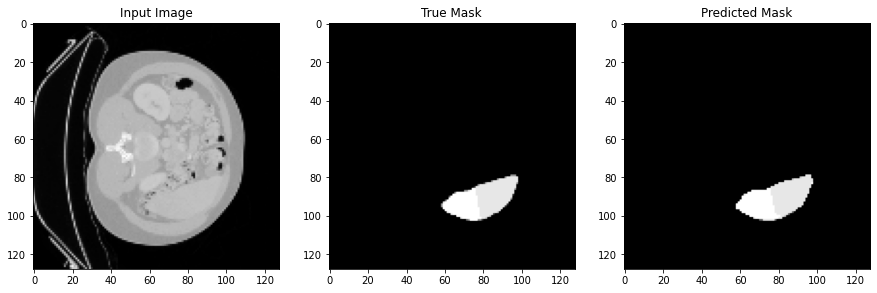

Instance in test dataset:  131


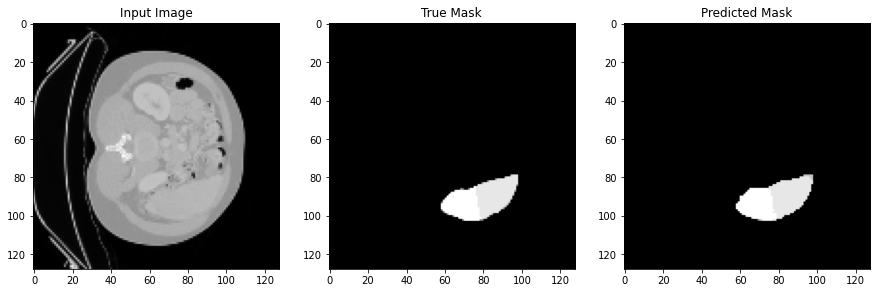

Instance in test dataset:  132


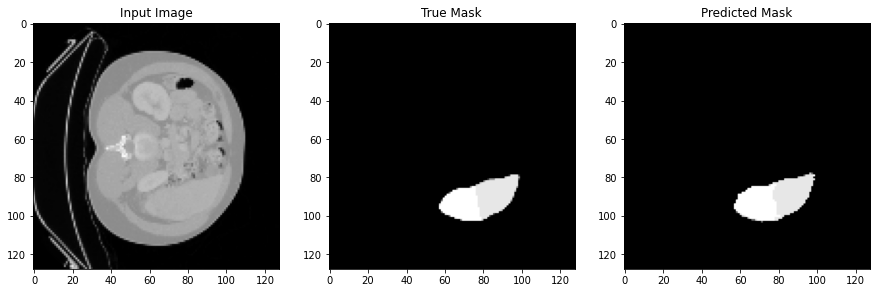

Instance in test dataset:  133


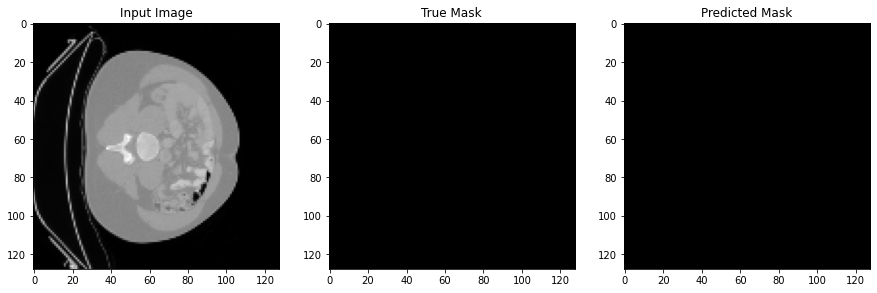

Instance in test dataset:  134


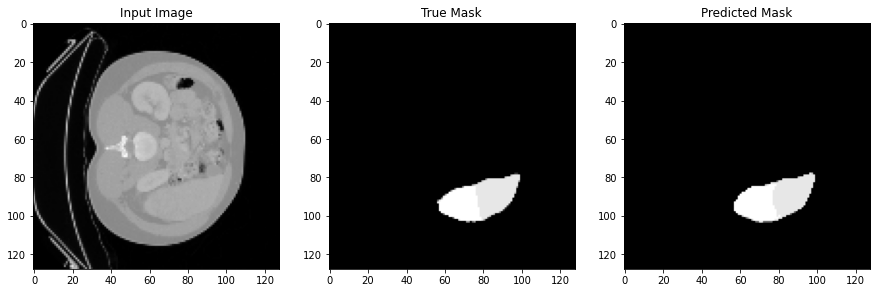

Instance in test dataset:  135


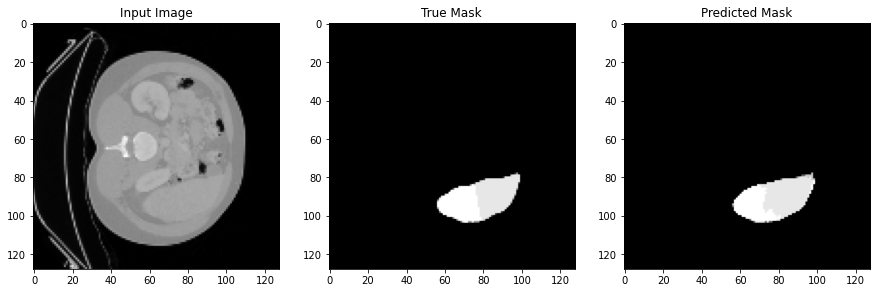

Instance in test dataset:  136


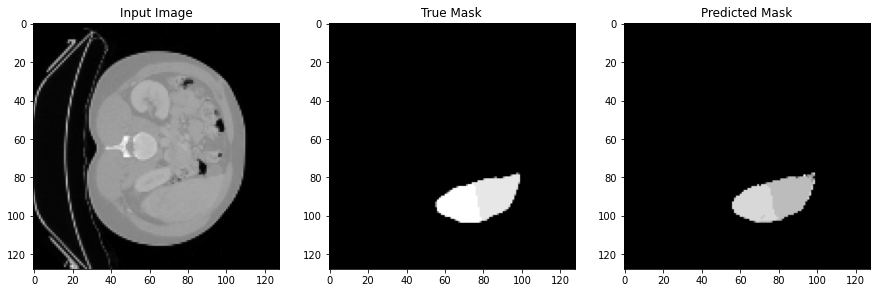

Instance in test dataset:  137


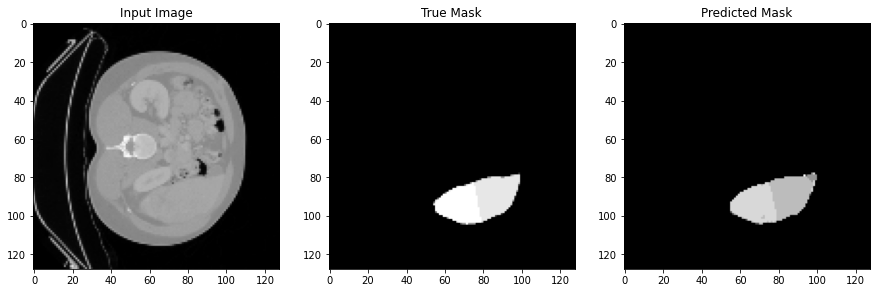

Instance in test dataset:  138


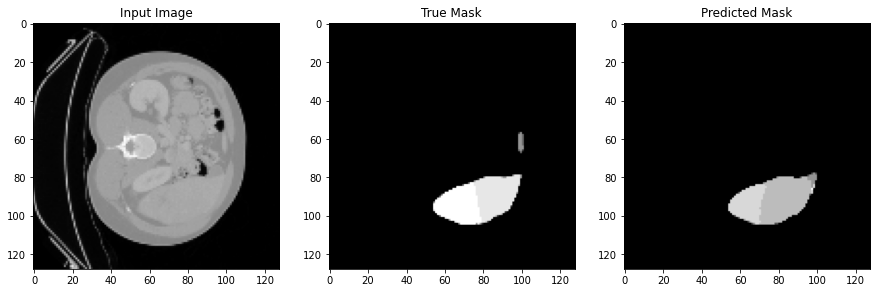

Instance in test dataset:  139


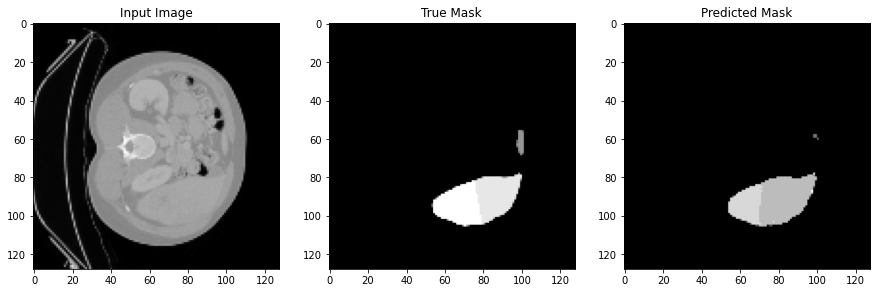

Instance in test dataset:  140


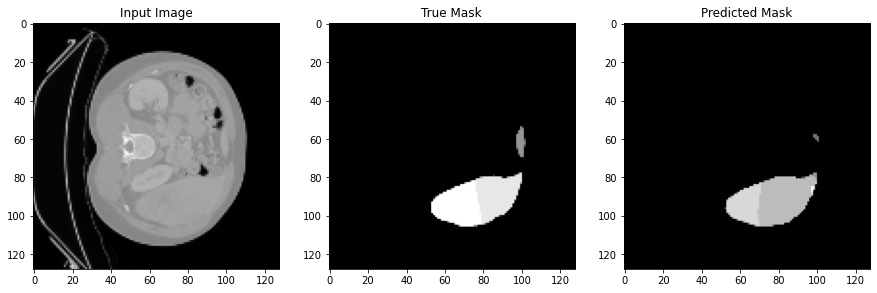

Instance in test dataset:  141


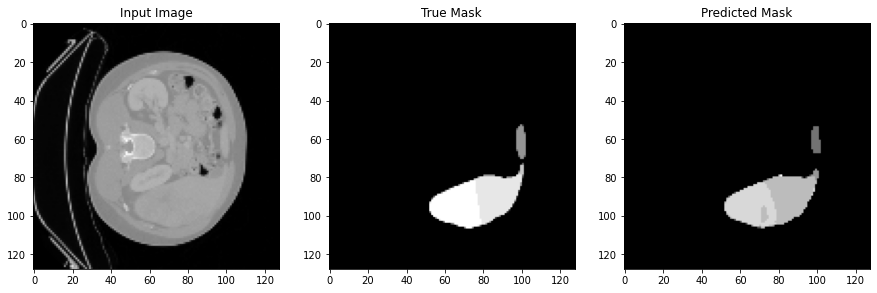

Instance in test dataset:  142


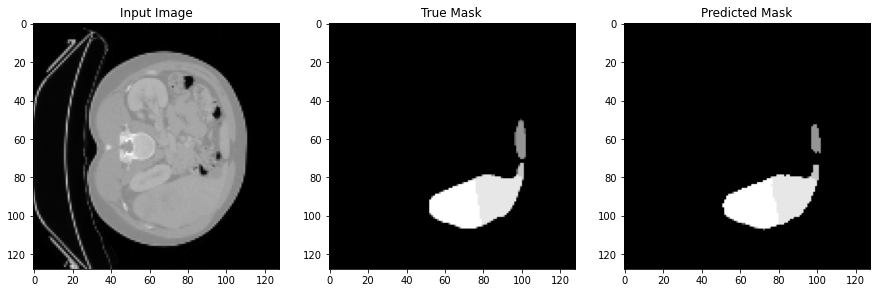

Instance in test dataset:  143


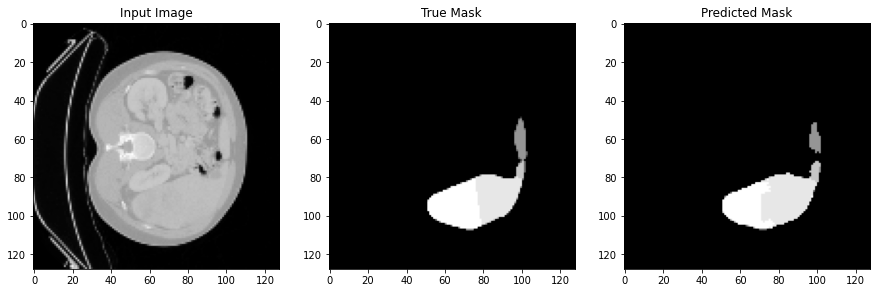

Instance in test dataset:  144


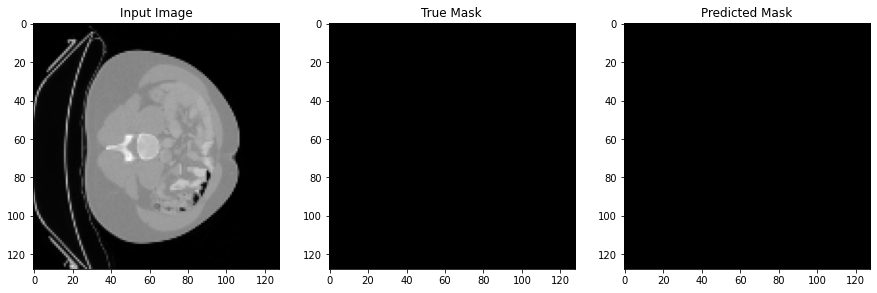

Instance in test dataset:  145


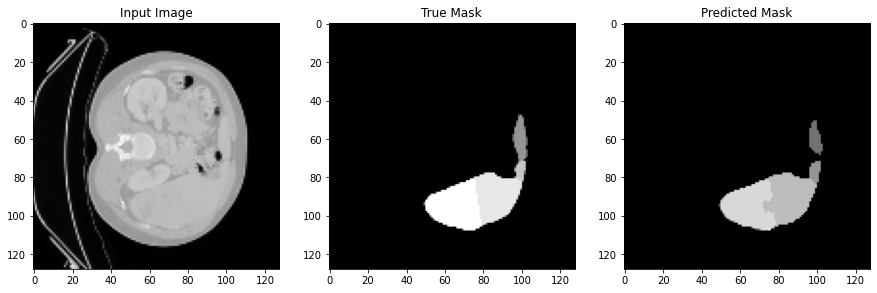

Instance in test dataset:  146


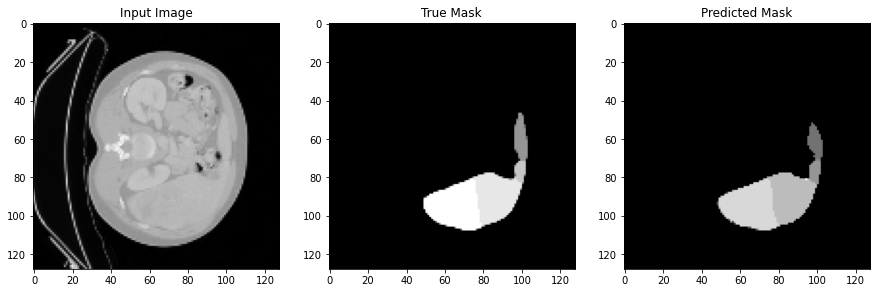

Instance in test dataset:  147


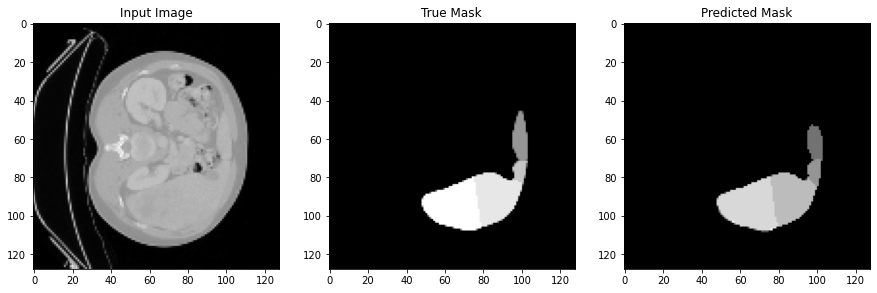

Instance in test dataset:  148


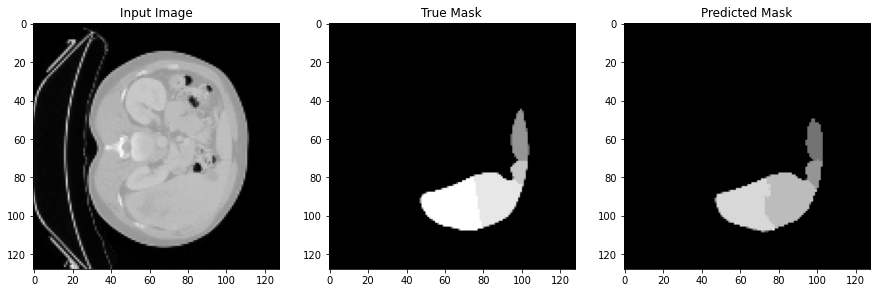

Instance in test dataset:  149


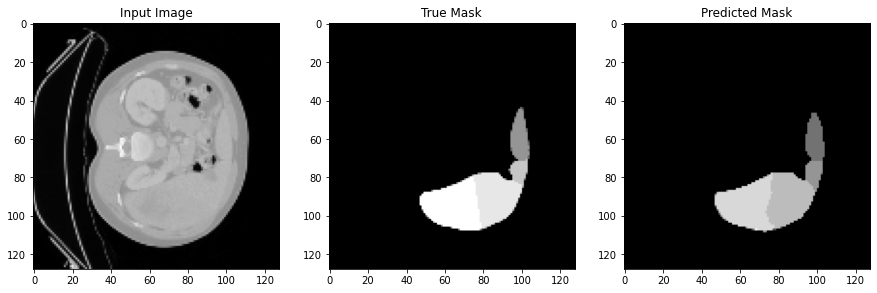

In [88]:
for i in range(0,150):
  print("Instance in test dataset: ", i)
  predicted =  np.expand_dims(models_mask_pred_argmax[i], axis=2)
  display([scaled_test_images[i], scaled_test_masks_no_encode[i], np.expand_dims(models_mask_pred_argmax[i], axis=2)])
  print("==================================================================================================================")